In [1]:
import random
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import time as tm
from time import time
import fitsio
import pandas as pd
from galpy.potential import MWPotential2014, vcirc, evaluateRforces
from galpy.orbit import Orbit
from scipy.stats import gaussian_kde
import corner
from scipy.stats import norm
from sklearn.mixture import GaussianMixture

from astroquery.gaia import Gaia
from astropy.table import Table
from astropy.table import Table, vstack
from glob import glob
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import balanced_accuracy_score
from sklearn.linear_model import LinearRegression

In preparation for Gaia DR4, the Gaia archive is in evolution. Unfortunately, it may be unstable at times and particular types of queries may time out. Please consider registering for a user account (https://www.cosmos.esa.int/web/gaia-users/register). For questions or advice, please contact the Gaia helpdesk (https://www.cosmos.esa.int/web/gaia/gaia-helpdesk).


In [2]:
# Apogee_DR19_csv = '/home/simon/MQ NGC3201 project copy/MQ NGC3201 project copy/Jupyter Notebooks/Apogee_with_kinematics.csv'
# Apogee_DR19_fits = '/home/simon/MQ NGC3201 project copy/MQ NGC3201 project copy/fits and csv files/Apogee_with_kinematics' # this one used potential derived from the ra, dec, pmra, pmde, and gaia_V_rad given in Apogee DR19
# Apogee_DR19_fits = '/home/simon/MQ NGC3201 project copy/MQ NGC3201 project copy/fits and csv files/Apogee_with_kinematics_from_apo_values.fits' # this one used potential derived from the ra, dec, pmra, pmde, and v_rad given in Apogee DR19
Apogee_DR19_fits = '/home/simon/MQ NGC3201 project copy/MQ NGC3201 project copy/fits and csv files/Apogee_with_kinematics_merge.fits' # this one instead uses kinematic values derived from the Gaia DR3 ids 

Vmans_NGC3201_txt = '/home/simon/MQ NGC3201 project copy/MQ NGC3201 project copy/fits and csv files/clusters/catalogues/NGC_3201.txt'
# Vmans_NGC3201_fits = '/home/simon/MQ NGC3201 project copy/MQ NGC3201 project copy/fits and csv files/clusters/catalogues/NGC_3201'
Vmans_NGC5139_txt = '/home/simon/MQ NGC3201 project copy/MQ NGC3201 project copy/fits and csv files/clusters/catalogues/NGC_5139_oCen.txt'
Vmans_NGC1851_txt = '/home/simon/MQ NGC3201 project copy/MQ NGC3201 project copy/fits and csv files/clusters/catalogues/NGC_1851.txt'

def ensure_native_endian(df):
    """Convert all numeric NumPy columns in a DataFrame to native byte order."""
    for col in df.columns:
        dtype = df[col].dtype

        # Only handle real NumPy dtypes (skip pandas extension dtypes like StringDtype)
        if not isinstance(dtype, np.dtype):
            continue

        # Skip already-native or non-byte-order dtypes
        if dtype.byteorder in ('=', '|'):
            continue

        if np.issubdtype(dtype, np.number):
            df[col] = df[col].astype(dtype.newbyteorder('='))
    
    return df

def weighted_avg_and_std(values, weights):
    """
    Return the weighted average and standard deviation.


    They weights are in effect first normalized so that they
    sum to 1 (and so they must not all be 0).


    values, weights -- NumPy ndarrays with the same shape.
    """
    average = np.average(values, weights=weights)
    # Fast and numerically precise:
    variance = np.average((values-average)**2, weights=weights)
    return (average, np.sqrt(variance))

def fit_gmm_and_get_pdf(data, n_components=3, n_points=1000):
    """Fit GMM and return x + PDF"""
    data = data.dropna().values.reshape(-1, 1)

    gmm = GaussianMixture(n_components=n_components)
    gmm.fit(data)

    x = np.linspace(data.min(), data.max(), n_points).reshape(-1, 1)
    pdf = np.exp(gmm.score_samples(x))

    return x, pdf


def plot_gmm(data, label, color, n_components=3):
    """Plot GMM curve"""
    x, pdf = fit_gmm_and_get_pdf(data, n_components)
    plt.plot(x, pdf, lw=2, color=color, label=f"{label}")


def plot_hist(data, label, color, alpha):
    """Plot histogram"""
    plt.hist(data, bins=30, density=True, alpha=alpha, color=color, label=label)

In [3]:
def Sequoia_cuts_Diane_2021(df):
    return (-1.0< df['jphi']/df['jtot']) & (df['jphi']/df['jtot']<-0.6) & (-1.0 < (df['jz'] - df['jr'])/df['jtot']) & (0.1 > (df['jz'] - df['jr'])/df['jtot']) 

def GSE_cuts_Diane_2021(df):
        return (-500< df['jphi']) & (500 > df['jphi']) & (30 < np.sqrt(df['jr'])) & (55 > np.sqrt(df['jr']))

In [4]:
Vmans_NGC3201 = pd.read_csv(
    Vmans_NGC3201_txt,
    sep='\t',
    header=0
)

# Remove the '#' from the first column name
Vmans_NGC3201.columns = Vmans_NGC3201.columns.str.replace('#', '').str.strip()

Vmans_NGC3201_high_prob = Vmans_NGC3201[(Vmans_NGC3201['memberprob'] > 0.99)]# & (Vmans_NGC3201['qflag'] == 0)]


Vmans_NGC5139 = pd.read_csv(
    Vmans_NGC5139_txt,
    sep='\t',
    header=0
)

# Remove the '#' from the first column name
Vmans_NGC5139.columns = Vmans_NGC5139.columns.str.replace('#', '').str.strip()

Vmans_NGC5139_high_prob = Vmans_NGC5139[(Vmans_NGC5139['memberprob'] > 0.99)]# & (Vmans_NGC5139['qflag'] == 0)]



Vmans_NGC1851 = pd.read_csv(
    Vmans_NGC1851_txt,
    sep='\t',
    header=0
)
Vmans_NGC1851.columns = Vmans_NGC1851.columns.str.replace('#', '').str.strip()
Vmans_NGC1851_high_prob = Vmans_NGC1851[(Vmans_NGC1851['memberprob'] > 0.99)]# & (Vmans_NGC5139['qflag'] == 0)]



In [5]:
# Vmans_NGC3201_high_prob
Vmans_NGC5139_high_prob

,source_id,ra,dec,x,y,plx,pmra,pmdec,plxe,pmrae,pmdece,pmcorr,g_mag,bp_rp,Sigma,qflag,memberprob
6,6084107253970200320,202.065231,-46.867403,0.2519,0.6116,0.2715,-3.2932,-6.7242,0.1518,0.1555,0.1259,-0.0234,18.3013,0.7771,13.58,3,0.99943
53,6084106944732531456,202.101751,-46.888817,0.2767,0.5900,-0.0680,-3.2649,-7.1885,0.3070,0.3608,0.2423,0.1034,19.3209,0.8586,13.83,3,0.99877
76,6083782313928810624,201.787432,-46.818910,0.0620,0.6606,0.1521,-2.8584,-6.9101,0.1990,0.2130,0.2032,-0.0662,18.6062,0.8357,13.52,3,0.99915
104,6083793210293953920,201.620994,-46.817947,-0.0519,0.6616,0.2995,-3.3833,-6.5496,0.0955,0.1005,0.0999,-0.0303,17.2205,0.8908,13.52,3,0.99840
121,6083793691330304640,201.719361,-46.819140,0.0154,0.6604,0.2000,-3.1514,-6.9146,0.0499,0.0593,0.0507,-0.0046,16.0901,1.0982,13.60,3,0.99991
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
228002,6083474832933020160,201.340694,-48.098412,-0.2379,-0.6194,0.2301,-3.1860,-6.3301,0.0643,0.0667,0.0606,0.0123,16.6938,1.0237,13.52,3,0.99940
228023,6083462527837890048,201.453786,-48.111966,-0.1623,-0.6326,0.5189,-3.3047,-6.9551,0.2611,0.3328,0.2257,0.3338,19.0177,0.7725,13.79,3,0.99646
228025,6083463180672917248,201.428670,-48.112555,-0.1791,-0.6333,0.4468,-3.5726,-6.9065,0.2016,0.2419,0.1914,0.2010,18.6250,0.8819,13.66,3,0.99703
228037,6083462527837883392,201.447104,-48.114805,-0.1667,-0.6355,0.5190,-3.0626,-6.9344,0.4797,0.5992,0.4393,0.2259,19.8815,0.7656,13.69,3,0.99325


In [6]:
# Apogee_DR19_raw = Table.read(Apogee_DR19_raw, format="csv")
# Apogee_DR19_raw = Apogee_DR19_raw.to_pandas()

with fitsio.FITS(Apogee_DR19_fits) as hdul1:
    data_1 = hdul1[1].read()
Apogee_DR19_raw = pd.DataFrame(data_1)
Apogee_DR19_raw = ensure_native_endian(Apogee_DR19_raw)

Apogee_DR19_raw = Apogee_DR19_raw[(Apogee_DR19_raw['result_flags'] == 0)
                          & (Apogee_DR19_raw['fe_h_flags'] == 0)
                          & (Apogee_DR19_raw['e_fe_h'] < 0.2)
                          & (Apogee_DR19_raw['snr'] > 50 )
                          & (Apogee_DR19_raw['spectrum_flags'] == 0)
                          ]

In [7]:
same_snr_dups = Apogee_DR19_raw[Apogee_DR19_raw.duplicated(['sdss_id', 'snr'], keep=False)]
print(same_snr_dups)

         sdss_id     sdss4_apogee_id   gaia_dr2_source_id  \
90      54487391  2M00004407+6151569   429529650538808576   
91      54487391  2M00004407+6151569   429529650538808576   
156     55747423  2M00010922+8528011   573643532933414144   
157     55747423  2M00010922+8528011   573643532933414144   
201     55747394  2M00012723+8520108   573636420467575808   
...          ...                 ...                  ...   
501152  88290914  2M19255717+1621170  4322379705736545536   
501176  63019370  2M21074846+0930014  1744239308997693824   
501177  63019370  2M21074846+0930014  1744239308997693824   
501191  62976634  2M21281456+0645030  1739061738807205760   
501192  62976634  2M21281456+0645030  1739061738807205760   

         gaia_dr3_source_id  tic_v8_id  healpix             lead  version_id  \
90       429529650538808576  417860131    11704  gaia_dr3_source          31   
91       429529650538808576  417860131    11704  gaia_dr3_source          31   
156      573643532933414144

In [8]:
same_snr_dups['sdss4_apogee_extra_target_flags']

90        0
91        0
156       0
157       0
201       0
         ..
501152    0
501176    0
501177    0
501191    1
501192    1
Name: sdss4_apogee_extra_target_flags, Length: 52504, dtype: int64

In [9]:
sep_on = 'snr'
col_name = 'sdss_id' 
df = Apogee_DR19_raw

df_sorted = df.sort_values(by=sep_on, ascending=False)

dup_ids = df_sorted.loc[df_sorted[col_name].duplicated(), col_name].unique()

In [10]:
def remove_duplicates(df, col_name, sep_on): #this is able to remove duplicates sure but... unfortunatly if there are things that have the same SNR it doesnt differenciate them
    # sort so highest snr comes first
    df_sorted = df.sort_values(by=sep_on, ascending=False)
    
    # keep only the first occurrence of each id
    df_clean = df_sorted.drop_duplicates(subset=col_name, keep='first')
    df_clean = df_clean.sort_values(by=col_name, ascending=True)
    return df_clean

Apogee_DR19 = remove_duplicates(Apogee_DR19_raw, 'sdss_id', 'snr')

In [11]:
# same_snr_dups2 = Apogee_DR19[Apogee_DR19.duplicated(['sdss_id', 'snr'], keep=False)]
# print(same_snr_dups2)

In [12]:
# Apogee_NGC5139 = Apogee_DR19[(Apogee_DR19['ra_gaia'] > 201.2)
#                              & (Apogee_DR19['ra_gaia'] < 202.2) 
#                              & (Apogee_DR19['dec_gaia'] > -47.8)
#                              & (Apogee_DR19['dec_gaia'] < -47.2)
#                              & (Apogee_DR19['pmra_gaia'] < 1)
#                              & (Apogee_DR19['pmra_gaia'] > -6)
#                              & (Apogee_DR19['pmde_gaia'] < -4)
#                              & (Apogee_DR19['pmde_gaia'] > -10)
#                             #  & (Apogee_DR19['jphi'] < 0)
#                              ]

# Apogee_NGC3201 = Apogee_DR19[(Apogee_DR19['pmra_gaia'] > 6.5)
#                             & (Apogee_DR19['pmra_gaia'] < 10)
#                             & (Apogee_DR19['pmde_gaia'] > -3.5)
#                             & (Apogee_DR19['pmde_gaia'] < -1)
#                             # & (Apogee_DR19['fe_h'] < 0.0)
#                             & (Apogee_DR19['ra_gaia'] > 152)
#                             & (Apogee_DR19['ra_gaia'] < 156)
#                             & (Apogee_DR19['dec_gaia'] > -49)
#                             & (Apogee_DR19['dec_gaia'] < -44)
#                             # & (Apogee_DR19['jphi'] < 0)
#                             ]


Apogee_NGC3201 = pd.merge( Apogee_DR19, Vmans_NGC3201_high_prob, left_on = 'gaia_dr3_source_id', right_on = 'source_id', how = 'inner')
Apogee_NGC5139 = pd.merge( Apogee_DR19, Vmans_NGC5139_high_prob, left_on = 'gaia_dr3_source_id', right_on = 'source_id', how = 'inner')
Apogee_NGC1851 = pd.merge( Apogee_DR19, Vmans_NGC1851_high_prob, left_on = 'gaia_dr3_source_id', right_on = 'source_id', how = 'inner')

Apogee_Thamnos1 = Apogee_DR19[((((np.sqrt(Apogee_DR19['jr'])- 13.5)**2) / (4.0**2)) + (((Apogee_DR19['jphi'] + 600)**2) / (350**2)) < 1)
                                        & (~Apogee_DR19['gaia_dr3_source_id'].isin(Apogee_NGC3201['gaia_dr3_source_id']))
                                        & (~Apogee_DR19['gaia_dr3_source_id'].isin(Apogee_NGC5139['gaia_dr3_source_id']))
                                      ]

Apogee_Thamnos2 = Apogee_DR19[(((np.sqrt(Apogee_DR19['jr'])-8.6)**2) / (3.5**2)) + (((Apogee_DR19['jphi'] + 1184)**2) / (175**2)) < 1
                                        & (~Apogee_DR19['gaia_dr3_source_id'].isin(Apogee_NGC3201['gaia_dr3_source_id']))
                                        & (~Apogee_DR19['gaia_dr3_source_id'].isin(Apogee_NGC5139['gaia_dr3_source_id']))
                                      ]

Apogee_GSE = Apogee_DR19[GSE_cuts_Diane_2021(Apogee_DR19)
                         & (~Apogee_DR19['gaia_dr3_source_id'].isin(Apogee_NGC3201['gaia_dr3_source_id']))
                         & (~Apogee_DR19['gaia_dr3_source_id'].isin(Apogee_NGC5139['gaia_dr3_source_id']))
                         & (~Apogee_DR19['gaia_dr3_source_id'].isin(Apogee_Thamnos1['gaia_dr3_source_id']))
                         & (~Apogee_DR19['gaia_dr3_source_id'].isin(Apogee_Thamnos2['gaia_dr3_source_id']))
                         ]

Apogee_Sequoia = Apogee_DR19[Sequoia_cuts_Diane_2021(Apogee_DR19)
                            & (~Apogee_DR19['gaia_dr3_source_id'].isin(Apogee_NGC3201['gaia_dr3_source_id']))
                            & (~Apogee_DR19['gaia_dr3_source_id'].isin(Apogee_NGC5139['gaia_dr3_source_id']))
                            & (~Apogee_DR19['gaia_dr3_source_id'].isin(Apogee_Thamnos1['gaia_dr3_source_id']))
                            & (~Apogee_DR19['gaia_dr3_source_id'].isin(Apogee_Thamnos2['gaia_dr3_source_id']))
                            # & ( (df['fe_h'] < -0.8))
                            ]

# Apogee_NGC5139_apo = Apogee_DR19[(Apogee_DR19['ra'] > 201.2)
#                              & (Apogee_DR19['ra'] < 202.2) 
#                              & (Apogee_DR19['dec'] > -47.8)
#                              & (Apogee_DR19['dec'] < -47.2)
#                              & (Apogee_DR19['pmra'] < 1)
#                              & (Apogee_DR19['pmra'] > -6)
#                              & (Apogee_DR19['pmde'] < -4)
#                              & (Apogee_DR19['pmde'] > -10)
#                             #  & (Apogee_DR19['jphi'] < 0)
#                              ]

# Apogee_NGC3201_apo = Apogee_DR19[(Apogee_DR19['pmra'] > 6.5)
#                             & (Apogee_DR19['pmra'] < 10)
#                             & (Apogee_DR19['pmde'] > -3.5)
#                             & (Apogee_DR19['pmde'] < -1)
#                             # & (Apogee_DR19['fe_h'] < 0.0)
#                             & (Apogee_DR19['ra'] > 152)
#                             & (Apogee_DR19['ra'] < 156)
#                             & (Apogee_DR19['dec'] > -49)
#                             & (Apogee_DR19['dec'] < -44)
#                             # & (Apogee_DR19['jphi'] < 0)
#                             ]

# Apogee_GSE = Apogee_DR19[GSE_cuts_Diane_2021(Apogee_DR19)
#                          & (~Apogee_DR19['gaia_dr3_source_id'].isin(Apogee_NGC3201_apo['gaia_dr3_source_id']))
#                          & (~Apogee_DR19['gaia_dr3_source_id'].isin(Apogee_NGC5139_apo['gaia_dr3_source_id']))
#                          ]

# Apogee_Sequoia = Apogee_DR19[Sequoia_cuts_Diane_2021(Apogee_DR19)
#                             & (~Apogee_DR19['gaia_dr3_source_id'].isin(Apogee_NGC3201_apo['gaia_dr3_source_id']))
#                             & (~Apogee_DR19['gaia_dr3_source_id'].isin(Apogee_NGC5139_apo['gaia_dr3_source_id']))
#                             ]

Apogee_Halo = Apogee_DR19[(np.sqrt((Apogee_DR19['vphi']-230)**2 + (Apogee_DR19['vr'])**2 + (Apogee_DR19['vz'])**2) > 230) # Koppelman et al. 2019  https://doi.org/10.1051/0004-6361/201936738
                            & (~Apogee_DR19['gaia_dr3_source_id'].isin(Apogee_NGC3201['gaia_dr3_source_id']))
                            & (~Apogee_DR19['gaia_dr3_source_id'].isin(Apogee_NGC5139['gaia_dr3_source_id']))
                            & (~Apogee_DR19['gaia_dr3_source_id'].isin(Apogee_Thamnos1['gaia_dr3_source_id']))
                            & (~Apogee_DR19['gaia_dr3_source_id'].isin(Apogee_Thamnos2['gaia_dr3_source_id'])) 
                            & (~Apogee_DR19['gaia_dr3_source_id'].isin(Apogee_GSE['gaia_dr3_source_id']))
                            & (~Apogee_DR19['gaia_dr3_source_id'].isin(Apogee_Sequoia['gaia_dr3_source_id'])) 
                             ]




In [13]:
for col in Apogee_NGC5139.columns:
    print(col)

sdss_id
sdss4_apogee_id
gaia_dr2_source_id
gaia_dr3_source_id
tic_v8_id
healpix
lead
version_id
catalogid
catalogid21
catalogid25
catalogid31
n_associated
n_neighborhood
sdss4_apogee_target1_flags
sdss4_apogee_target2_flags
sdss4_apogee2_target1_flags
sdss4_apogee2_target2_flags
sdss4_apogee2_target3_flags
sdss4_apogee_member_flags
sdss4_apogee_extra_target_flags
ra_Apogee
dec_Apogee
l
b
plx_x
e_plx
pmra_Apogee
e_pmra
pmde_Apogee
e_pmde
gaia_v_rad
gaia_e_v_rad
g_mag_x
bp_mag
rp_mag
j_mag
e_j_mag
h_mag
e_h_mag
k_mag
e_k_mag
ph_qual
bl_flg
cc_flg
w1_mag
e_w1_mag
w1_flux
w1_dflux
w1_frac
w2_mag
e_w2_mag
w2_flux
w2_dflux
w2_frac
w1uflags
w2uflags
w1aflags
w2aflags
mag4_5
d4_5m
rms_f4_5
sqf_4_5
mf4_5
csf
zgr_teff
zgr_e_teff
zgr_logg
zgr_e_logg
zgr_fe_h
zgr_e_fe_h
zgr_e
zgr_e_e
zgr_plx
zgr_e_plx
zgr_teff_confidence
zgr_logg_confidence
zgr_fe_h_confidence
zgr_ln_prior
zgr_chi2
zgr_quality_flags
r_med_geo
r_lo_geo
r_hi_geo
r_med_photogeo
r_lo_photogeo
r_hi_photogeo
bailer_jones_flags
ebv
e_ebv

Text(0.5, 1.0, 'Apogee')

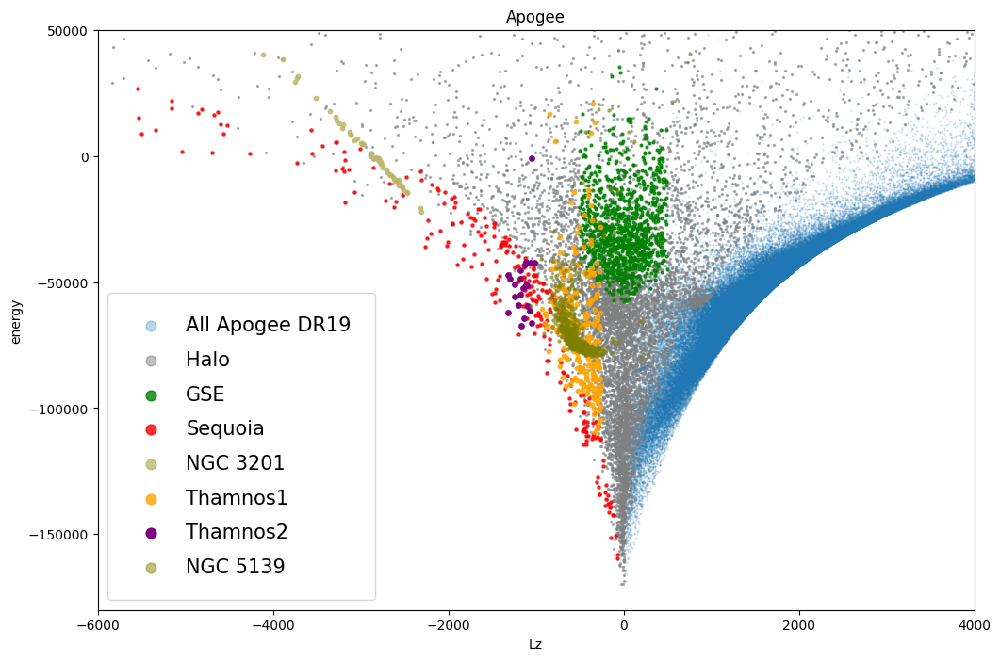

In [14]:
plt.figure(figsize=(12, 8))
# Apogee_DR19 = Apogee_DR19[Apogee_DR19['mn_h_flags'] == 0]
# plt.scatter(Apogee_DR19['jphi'], Apogee_DR19['energy'], label = 'All APogee DR19', s = 0.2, alpha = 1, c = Apogee_DR19['mg_h'] - Apogee_DR19['fe_h'], cmap = 'rainbow')
plt.scatter(Apogee_DR19['jphi'], Apogee_DR19['energy'], label = 'All Apogee DR19', s = 0.2, alpha = 0.3)# , c = Apogee_DR19['mg_h'] - Apogee_DR19['fe_h'], cmap = 'rainbow')
plt.scatter(Apogee_Halo['jphi'], Apogee_Halo['energy'], label = 'Halo', c  = 'grey' ,s = 2, alpha = 0.5)
plt.scatter(Apogee_GSE['jphi'], Apogee_GSE['energy'], label = 'GSE', s = 4, alpha = 0.8, c = 'g')
plt.scatter(Apogee_Sequoia['jphi'], Apogee_Sequoia['energy'], label = 'Sequoia', s = 5, alpha = 0.8, c = 'r')
plt.scatter(Apogee_NGC3201['jphi'], Apogee_NGC3201['energy'], label = 'NGC 3201', s = 10, alpha = 0.8, c='darkkhaki')  #c= Apogee_NGC3201['fe_h'])


plt.scatter(Apogee_Thamnos1['jphi'], Apogee_Thamnos1['energy'], label = 'Thamnos1', s = 10, alpha = 0.8, c = 'orange')
plt.scatter(Apogee_Thamnos2['jphi'], Apogee_Thamnos2['energy'], label = 'Thamnos2', s = 15, alpha = 1.0, c = 'purple')
plt.scatter(Apogee_NGC5139['jphi'], Apogee_NGC5139['energy'], label = 'NGC 5139', s = 5, alpha = 0.5, c = 'olive')

plt.xlim(-6000, 4000)
plt.ylim(-180000,50000)
leg = plt.legend(fontsize=15, labelspacing=0.8, borderpad=1.2)
for handle in leg.legend_handles:
    handle.set_sizes([60])
plt.xlabel('Lz')
plt.ylabel('energy')
plt.title('Apogee')
# plt.colorbar();

Text(0.5, 1.0, 'Apogee')

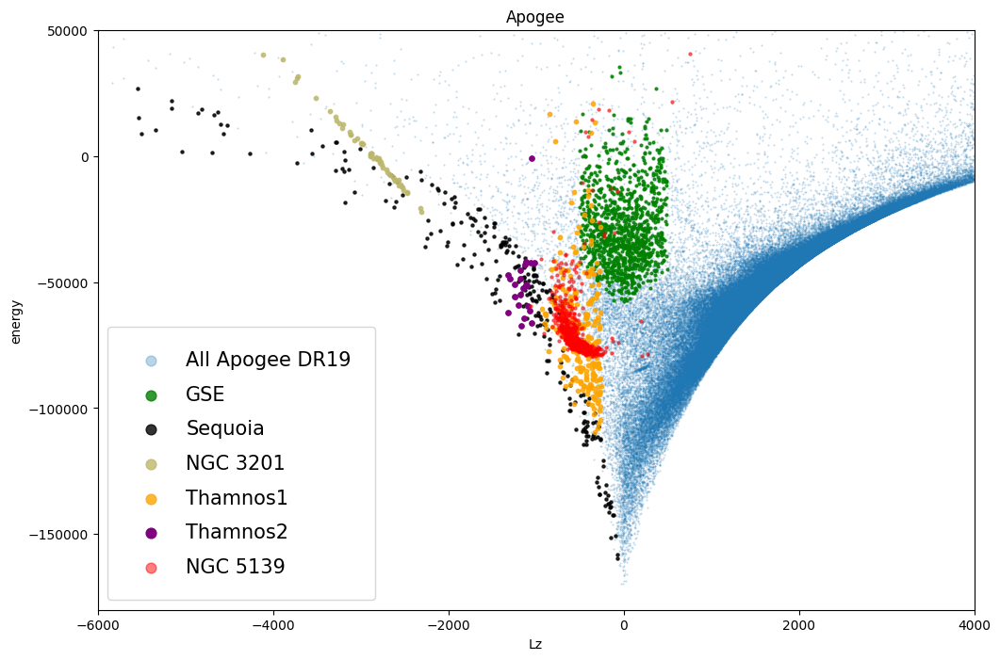

In [15]:
plt.figure(figsize=(12, 8))
# Apogee_DR19 = Apogee_DR19[Apogee_DR19['mn_h_flags'] == 0]
# plt.scatter(Apogee_DR19['jphi'], Apogee_DR19['energy'], label = 'All APogee DR19', s = 0.2, alpha = 1, c = Apogee_DR19['mg_h'] - Apogee_DR19['fe_h'], cmap = 'rainbow')
plt.scatter(Apogee_DR19['jphi'], Apogee_DR19['energy'], label = 'All Apogee DR19', s = 0.2, alpha = 0.3)# , c = Apogee_DR19['mg_h'] - Apogee_DR19['fe_h'], cmap = 'rainbow')
plt.scatter(Apogee_GSE['jphi'], Apogee_GSE['energy'], label = 'GSE', s = 4, alpha = 0.8, c = 'g')
plt.scatter(Apogee_Sequoia['jphi'], Apogee_Sequoia['energy'], label = 'Sequoia', s = 5, alpha = 0.8, c = 'k')
plt.scatter(Apogee_NGC3201['jphi'], Apogee_NGC3201['energy'], label = 'NGC 3201', s = 10, alpha = 0.8, c='darkkhaki')  #c= Apogee_NGC3201['fe_h'])


plt.scatter(Apogee_Thamnos1['jphi'], Apogee_Thamnos1['energy'], label = 'Thamnos1', s = 10, alpha = 0.8, c = 'orange')
plt.scatter(Apogee_Thamnos2['jphi'], Apogee_Thamnos2['energy'], label = 'Thamnos2', s = 15, alpha = 1.0, c = 'purple')
plt.scatter(Apogee_NGC5139['jphi'], Apogee_NGC5139['energy'], label = 'NGC 5139', s = 5, alpha = 0.5, c = 'red')

plt.xlim(-6000, 4000)
plt.ylim(-180000,50000)
leg = plt.legend(fontsize=15, labelspacing=0.8, borderpad=1.2)
for handle in leg.legend_handles:
    handle.set_sizes([60])
plt.xlabel('Lz')
plt.ylabel('energy')
plt.title('Apogee')
# plt.colorbar();

/home/simon/miniconda3/envs/environment_trial1/lib/python3.14/site-packages/IPython/core/events.py:96: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)

/home/simon/miniconda3/envs/environment_trial1/lib/python3.14/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)



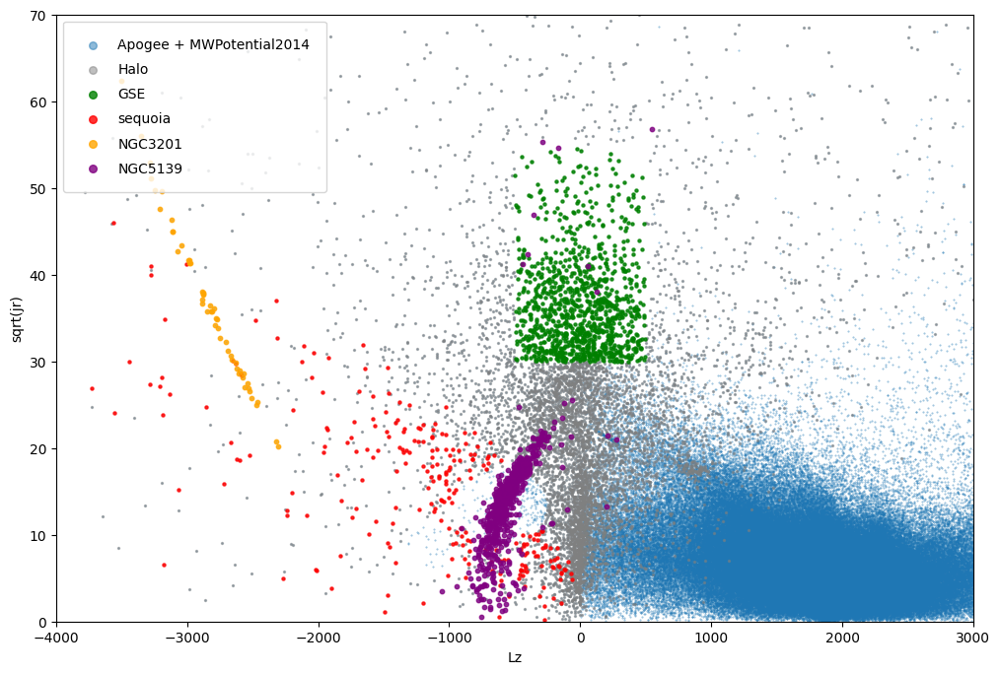

In [16]:
plt.figure(figsize=(12, 8))

plt.scatter(Apogee_DR19['jphi'], np.sqrt(Apogee_DR19['jr']), label = 'Apogee + MWPotential2014', s = 0.2, alpha = 0.5)
plt.scatter(Apogee_Halo['jphi'], np.sqrt(Apogee_Halo['jr']), label = 'Halo', s = 2, alpha = 0.5, c = 'grey')
plt.scatter(Apogee_GSE['jphi'], np.sqrt(Apogee_GSE['jr']), label = 'GSE', s = 5, alpha = 0.8, c = 'g')
plt.scatter(Apogee_Sequoia['jphi'], np.sqrt(Apogee_Sequoia['jr']), label = 'sequoia', s = 5, alpha = 0.8, c = 'r')
plt.scatter(Apogee_NGC3201['jphi'], np.sqrt(Apogee_NGC3201['jr']), label = 'NGC3201', s = 10, alpha = 0.8, c = 'orange')
plt.scatter(Apogee_NGC5139['jphi'], np.sqrt(Apogee_NGC5139['jr']), label = 'NGC5139', s = 10, alpha = 0.8, c = 'purple')


plt.xlim(-4000, 3000)
plt.ylim(0,70)
leg = plt.legend(fontsize=10, labelspacing=0.8, borderpad=1.2)
for handle in leg.legend_handles:
    handle.set_sizes([30])
plt.xlabel('Lz')
plt.ylabel('sqrt(jr)');

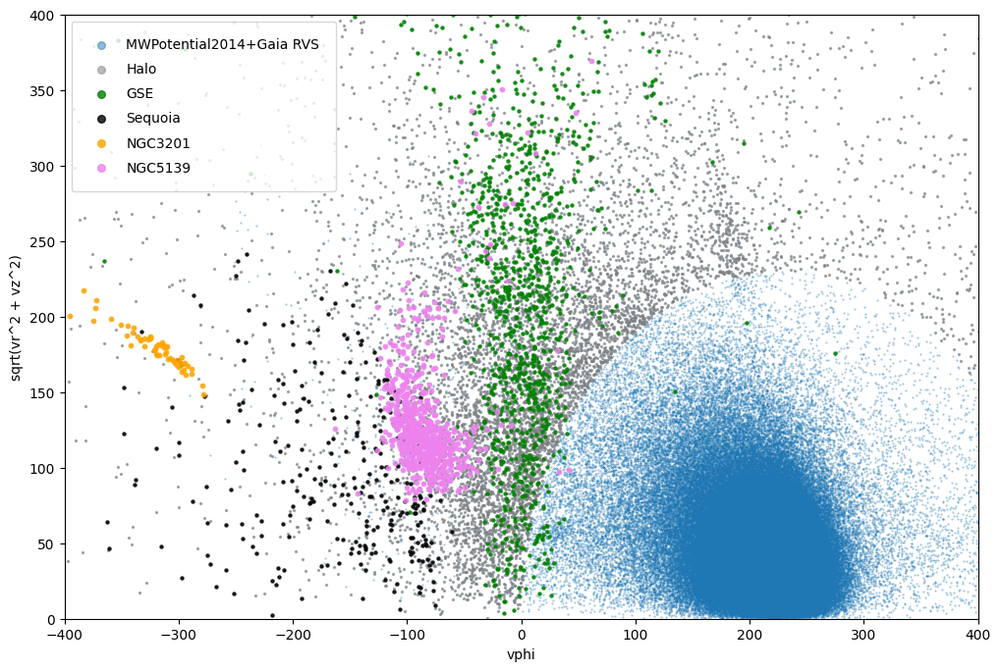

In [17]:
plt.figure(figsize=(12, 8))

plt.scatter(Apogee_DR19['vphi'], np.sqrt((Apogee_DR19['vr'])**2 + (Apogee_DR19['vz'])**2), label = 'MWPotential2014+Gaia RVS', s = 0.2, alpha = 0.5)
plt.scatter(Apogee_Halo['vphi'], np.sqrt((Apogee_Halo['vr'])**2 + (Apogee_Halo['vz'])**2), label = 'Halo', s = 2, alpha = 0.5, c = 'grey')
plt.scatter(Apogee_GSE['vphi'], np.sqrt((Apogee_GSE['vr'])**2 + (Apogee_GSE['vz'])**2), label = 'GSE', s = 5, alpha = 0.8, c = 'g')
plt.scatter(Apogee_Sequoia['vphi'], np.sqrt((Apogee_Sequoia['vr'])**2 + (Apogee_Sequoia['vz'])**2), label = 'Sequoia', s = 5, alpha = 0.8, c = 'k')
plt.scatter(Apogee_NGC3201['vphi'], np.sqrt((Apogee_NGC3201['vr'])**2 + (Apogee_NGC3201['vz'])**2), label = 'NGC3201', s = 10, alpha = 0.8, c = 'orange')
plt.scatter(Apogee_NGC5139['vphi'], np.sqrt((Apogee_NGC5139['vr'])**2 + (Apogee_NGC5139['vz'])**2), label = 'NGC5139', s = 10, alpha = 0.8, c = 'violet')

plt.xlim(-400, 400)
plt.ylim(0,400)
leg = plt.legend(fontsize=10, labelspacing=0.8, borderpad=1.2)
for handle in leg.legend_handles:
    handle.set_sizes([30])
plt.xlabel('vphi')
plt.ylabel('sqrt(vr^2 + vz^2)');

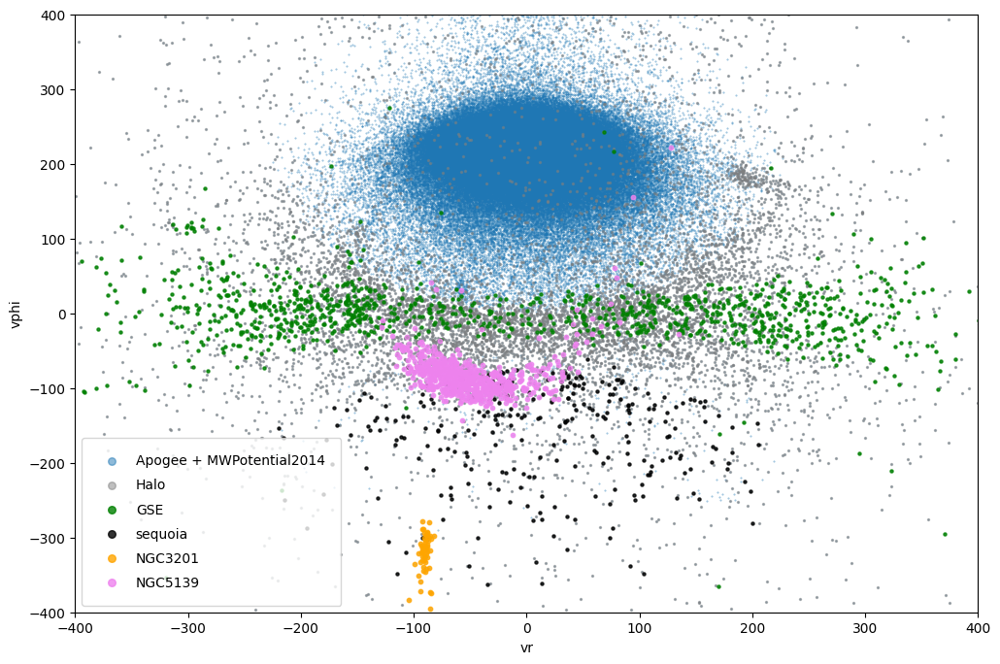

In [18]:
plt.figure(figsize=(12, 8))

plt.scatter(Apogee_DR19['vr'], Apogee_DR19['vphi'],  label = 'Apogee + MWPotential2014', s = 0.2, alpha = 0.5)
plt.scatter(Apogee_Halo['vr'], Apogee_Halo['vphi'],  label = 'Halo', s = 2, alpha = 0.5, c = 'grey')
plt.scatter(Apogee_GSE['vr'], Apogee_GSE['vphi'],  label = 'GSE', s = 5, alpha = 0.8, c = 'g')
plt.scatter(Apogee_Sequoia['vr'], Apogee_Sequoia['vphi'],  label = 'sequoia', s = 5, alpha = 0.8, c = 'k')
plt.scatter(Apogee_NGC3201['vr'], Apogee_NGC3201['vphi'],  label = 'NGC3201', s = 10, alpha = 0.8, c = 'orange')
plt.scatter(Apogee_NGC5139['vr'], Apogee_NGC5139['vphi'],  label = 'NGC5139', s = 10, alpha = 0.8, c = 'violet')

plt.xlim(-400, 400)
plt.ylim(-400,400)
leg = plt.legend(fontsize=10, labelspacing=0.8, borderpad=1.2)
for handle in leg.legend_handles:
    handle.set_sizes([30])
plt.xlabel('vr')
plt.ylabel('vphi');

In [19]:
element_list_full_Apogee = ["h", "fe", "c", "n", "o", "na", "mg", "al", "si", "p", "s", "k", "ca" ,"ti", "v", "cr" ,"mn", "co", "ni", "cu", "ce", "nd",]# there is nn_li in galah (nural network Li/Fe) but I dont want to include that right now.
element_list_partial_small_Apogee = ['fe', 'al', "na", 'ca', 'mn', 'mg', 'ti', 'nd']
some_neutron_capture = ['fe', 'al', 'mn', 'mg', "ce", "nd"]
elements_in_Pradosh_Apogee = []

def make_elm_ratio_combinations_Apogee( data_set, element_list):
    element_in_list = element_list
    new_element_ratios_list = []
    new_element_ratio_errors_list = []

    data_set_flagged = data_set
    for i in element_in_list:
        X_flag =  f'{i}' + '_h' + '_flags'
        data_set_flagged = data_set_flagged[data_set_flagged[X_flag] == 0]
        # print(len(data_set_flagged['fe_h']))
        # print(X_flag)
        e_X_h = 'e_' + f'{i}' + '_h'
        data_set_flagged = data_set_flagged[data_set_flagged[e_X_h] < 0.2]
        
    for i in range(len(element_in_list)):
        for j in range(i+1, len(element_in_list)):
            if element_in_list[j] in ["h"]:
                print("You should not be including h")
            elif element_in_list[j] not in ["h"]:
                col_name_for_numerator = element_in_list[j] + "_h" # finds the names of the columns that will be needed to to calculate the numerator in the new ratio. E.g. if I want Ca/Ti, this would get Ca/Fe for the numerator
                # print("col_name_for_numerator:", col_name_for_numerator)
                err_col_numerator = 'e_' + col_name_for_numerator # same as above but now adds the 'e_' to find the error column for the corresponding ratio column
                # print('err_col_numerator:', err_col_numerator)
            if element_in_list[i] in ["h"]:
                print("You should not be including h")
            elif element_in_list[i] not in ["h"]:
                col_name_for_denominator = element_in_list[i] + "_h" # finds the names of the columns that will be needed to to calculate the denominator in the new ratio. E.g. if I want Ca/Ti, this would get Ti/Fe for the denominator
                # print('col_name_for_denominator:', col_name_for_denominator)
                err_col_denominator = 'e_' + col_name_for_denominator # same as above but now adds the 'e_' to find the error column for the corresponding ratio column
                # print('err_col_denominator:', err_col_denominator)
           
            new_ratio_label = element_in_list[j] + "_" + element_in_list[i]
            # print('new_ratio_label:', new_ratio_label)
            new_element_ratios_list.append(new_ratio_label)
            # print("new_element_ratios_list", new_element_ratios_list)
            # print("")

            new_ratio_error_label = 'e_' + element_in_list[j] + "_"+ element_in_list[i]
            # print('new_error_label:', new_ratio_error_label)
            new_element_ratio_errors_list.append(new_ratio_error_label)
            # print("new_element_ratio_errors_list", new_element_ratio_errors_list)
            # print("")
            # print('------------------------------------------------------')
            # print("")

            data_set_flagged[new_ratio_label] = data_set_flagged[col_name_for_numerator] - data_set_flagged[col_name_for_denominator] # this adds a new column to apogee's catalog. It give the column the name and finds the ratio values
            data_set_flagged[new_ratio_error_label] = np.sqrt((data_set_flagged[err_col_numerator])**2 + (data_set_flagged[err_col_denominator])**2)
            data_set_flagged = data_set_flagged.dropna(subset=[new_ratio_label])

    return data_set_flagged, new_element_ratios_list, new_element_ratio_errors_list,

In [21]:
element_list_full_Apogee = ["h", "fe", "c", "n", "o", "na", "mg", "al", "si", "p", "s", "k", "ca" ,"ti", "v", "cr" ,"mn", "co", "ni", "cu", "ce", "nd",]# there is nn_li in galah (nural network Li/Fe) but I dont want to include that right now.
element_list_partial_small_Apogee_1 = ['fe', 'al', "na", 'ca', 'mn', 'mg', 'ti', 'nd']
element_list_partial_small_Apogee_2 = ['fe', 'mn', 'mg', 'c', 'ni', 'al', 'cu', 'nd']
some_neutron_capture = ['fe', 'al', 'mn', 'mg', "ce", "nd"]
elements_in_Pradosh_Apogee = []

element_list = element_list_partial_small_Apogee_2

Apogee_new_ratios_catolog_ratiolist_ratioerrorlist = make_elm_ratio_combinations_Apogee(Apogee_DR19, element_list)

Apogee_new_ratios = Apogee_new_ratios_catolog_ratiolist_ratioerrorlist[0]
Apogee_new_element_ratio_list = Apogee_new_ratios_catolog_ratiolist_ratioerrorlist[1]
Apogee_new_element_ratio_errors_list = Apogee_new_ratios_catolog_ratiolist_ratioerrorlist[2] 

Apogee_GSE_new_ratios_catolog_ratiolist_ratioerrorlist = make_elm_ratio_combinations_Apogee(Apogee_GSE, element_list)
Apogee_GSE_new_ratios = Apogee_GSE_new_ratios_catolog_ratiolist_ratioerrorlist[0]

Apogee_Sequoia_new_ratios_catolog_ratiolist_ratioerrorlist = make_elm_ratio_combinations_Apogee(Apogee_Sequoia, element_list)
Apogee_Sequoia_new_ratios = Apogee_Sequoia_new_ratios_catolog_ratiolist_ratioerrorlist[0]

Apogee_NGC3201_new_ratios_catolog_ratiolist_ratioerrorlist = make_elm_ratio_combinations_Apogee(Apogee_NGC3201, element_list)
Apogee_NGC3201_new_ratios = Apogee_NGC3201_new_ratios_catolog_ratiolist_ratioerrorlist[0]

# Apogee_NGC3201_new_ratios_catolog_ratiolist_ratioerrorlist = make_elm_ratio_combinations_Apogee(Apogee_NGC3201_apo, element_list)
# Apogee_NGC3201_new_ratios = Apogee_NGC3201_new_ratios_catolog_ratiolist_ratioerrorlist[0]

Apogee_NGC5139_new_ratios_catolog_ratiolist_ratioerrorlist = make_elm_ratio_combinations_Apogee(Apogee_NGC5139, element_list)
Apogee_NGC5139_new_ratios = Apogee_NGC5139_new_ratios_catolog_ratiolist_ratioerrorlist[0]

# Apogee_NGC5139_new_ratios_catolog_ratiolist_ratioerrorlist = make_elm_ratio_combinations_Apogee(Apogee_NGC5139_apo, element_list)
# Apogee_NGC5139_new_ratios = Apogee_NGC5139_new_ratios_catolog_ratiolist_ratioerrorlist[0]

Apogee_NGC1851_new_ratios_catolog_ratiolist_ratioerrorlist = make_elm_ratio_combinations_Apogee(Apogee_NGC1851, element_list)
Apogee_NGC1851_new_ratios = Apogee_NGC1851_new_ratios_catolog_ratiolist_ratioerrorlist[0]

Apogee_Thamnos1_new_ratios_catolog_ratiolist_ratioerrorlist = make_elm_ratio_combinations_Apogee(Apogee_Thamnos1, element_list)
Apogee_Thamnos1_new_ratios = Apogee_Thamnos1_new_ratios_catolog_ratiolist_ratioerrorlist[0]

Apogee_Thamnos2_new_ratios_catolog_ratiolist_ratioerrorlist = make_elm_ratio_combinations_Apogee(Apogee_Thamnos2, element_list)
Apogee_Thamnos2_new_ratios = Apogee_Thamnos2_new_ratios_catolog_ratiolist_ratioerrorlist[0]

Apogee_Halo_new_ratios_catolog_ratiolist_ratioerrorlist = make_elm_ratio_combinations_Apogee(Apogee_Halo, element_list)
Apogee_Halo_new_ratios = Apogee_Halo_new_ratios_catolog_ratiolist_ratioerrorlist[0]

Halo: 7072 stars, 28 element ratios
Apogee_GSE: 781 stars, 28 element ratios
Apogee_Sequoia: 153 stars, 28 element ratios


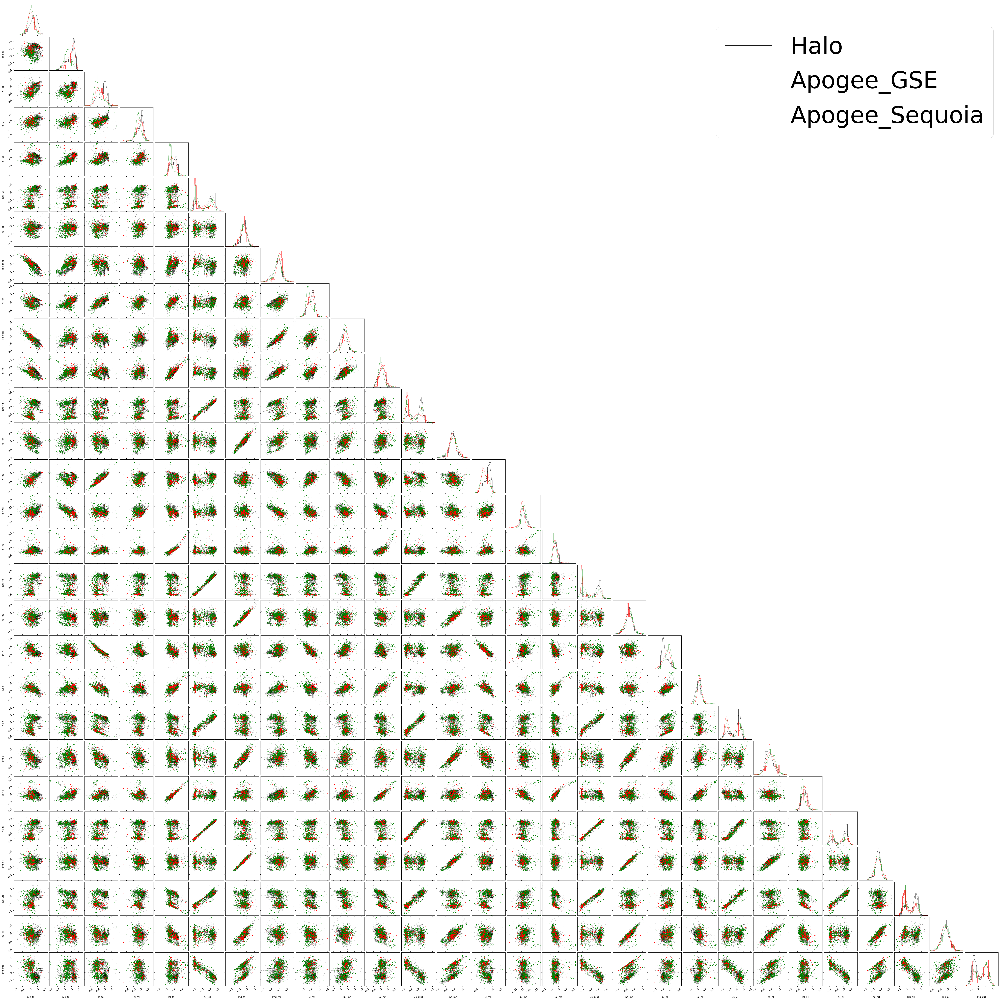

In [22]:
labels = [f'[{label}]' for label in Apogee_new_element_ratio_list]

first_plot = 'Halo' #pick one of the keys in corner_datasets

corner_datasets = {
    # 'All': (Apogee_new_ratios[Apogee_new_element_ratio_list], Apogee_new_ratios[Apogee_new_element_ratio_errors_list], "black", 1, 0.5),
    'Halo': (Apogee_Halo_new_ratios[Apogee_new_element_ratio_list], Apogee_Halo_new_ratios[Apogee_new_element_ratio_errors_list], "black", 1, 0.5),
    "Apogee_GSE": (Apogee_GSE_new_ratios[Apogee_new_element_ratio_list], Apogee_GSE_new_ratios[Apogee_new_element_ratio_errors_list],"green", 2.5, 1.0),
    "Apogee_Sequoia": (Apogee_Sequoia_new_ratios[Apogee_new_element_ratio_list], Apogee_Sequoia_new_ratios[Apogee_new_element_ratio_errors_list],"red", 2.5, 1.0),
    # "Apogee_NGC3201_new_ratios": (Apogee_NGC3201_new_ratios[Apogee_new_element_ratio_list], Apogee_NGC3201_new_ratios[Apogee_new_element_ratio_errors_list],"blue", 2.5, 1.0),
    # "Apogee_NGC5139_new_ratios": (Apogee_NGC5139_new_ratios[Apogee_new_element_ratio_list], Apogee_NGC5139_new_ratios[Apogee_new_element_ratio_errors_list],"purple", 2.5, 1.0),
}

# keys = sorted(corner_datasets.keys())  # sorted = consistent colors across runs
# cmap = plt.cm.tab10
# colors = cmap(np.linspace(0, 0.8, len(keys)))

# for key, color in zip(keys, colors):
#     df_values, df_errors, _, ms, alpha = corner_datasets[key]
#     corner_datasets[key] = (df_values, df_errors, color, ms, alpha)
# # Convert all to values and keep data info

for key in corner_datasets:
    df_values, df_errors, color, ms, alpha = corner_datasets[key] #data frame, color, markersize, alpha

    vals = df_values.to_numpy()
    # vals, mask = filter_constant_columns(vals)
    errs = df_errors.to_numpy()
    row_mask = np.any(np.isfinite(vals), axis=1)
    vals = vals[row_mask]
    errs = errs[row_mask]
    print(f"{key}: {df_values.shape[0]} stars, {df_values.shape[1]} element ratios")
    corner_datasets[key] = (vals, errs, color, ms, alpha)
 
first_values, first_errors, first_color, first_ms, first_alpha = corner_datasets[first_plot]
fig = corner.corner(
first_values,
labels=labels,
color=first_color,
data_kwargs={'ms': first_ms, 'alpha': first_alpha, 'color': first_color},
hist_kwargs={"density": True, "histtype": "step", "linewidth": 0.5},
plot_datapoints=True,
plot_contours=False,
fill_contours=False,
plot_density=False,
)

ndim = first_values.shape[1]
axes = np.array(fig.axes).reshape((ndim, ndim))

# Function to overlay Gaussian
# def overlay_gaussian(values, errors, color):
#     for i in range(ndim):
#         ax = axes[i, i]
#         x = values[:, i]
#         sigma_x = errors[:,i]
#         mask = np.isfinite(x) & np.isfinite(sigma_x)
#         x = x[mask]
#         sigma_x = sigma_x[mask]
#         if len(x) > 1:
#             mu, sigma = weighted_avg_and_std(x, sigma_x) #now this should be weighting the errors better
#             weights  = 1 / sigma_x**2
#             x_grid = np.linspace(ax.get_xlim()[0], ax.get_xlim()[1], 500)
#             ax.plot(x_grid, norm.pdf(x_grid, mu, sigma), color=color, lw=2)

def overlay_gaussian(values, errors, color, n_components):
    for i in range(ndim):
        ax = axes[i, i]
        x = values[:, i]
        sigma_x = errors[:, i]

        mask = np.isfinite(x) & np.isfinite(sigma_x)
        x = x[mask]

        if len(x) > 5:  # need enough points
            # Fit 2-component Gaussian Mixture
            gmm = GaussianMixture(n_components=n_components)
            gmm.fit(x.reshape(-1, 1))

            x_grid = np.linspace(ax.get_xlim()[0], ax.get_xlim()[1], 500)

            pdf = np.zeros_like(x_grid)

            # Sum the two Gaussians
            for weight, mean, cov in zip(gmm.weights_, gmm.means_, gmm.covariances_):
                sigma = np.sqrt(cov[0][0])
                pdf += weight * norm.pdf(x_grid, mean[0], sigma)

                # (optional) plot individual components
                ax.plot(x_grid,
                        weight * norm.pdf(x_grid, mean[0], sigma),
                        color=color,
                        lw=1,
                        # ls='dashed',
                        ls = "none",
                        alpha=0.7)

            # Plot total mixture
            ax.plot(x_grid, pdf, color=color, lw=0.5)

# Overlay remaining datasets
handles = []
for key, (values, errors, color, ms, alpha) in corner_datasets.items():
    if key != first_plot:
        corner.corner(
            values,
            fig=fig,
            color=color,
            data_kwargs={'ms': ms, 'alpha': alpha, 'color': color},
            hist_kwargs={"density": True, "histtype": "step", "linewidth": 0.5},
            plot_datapoints=True,
            plot_contours=False,
            fill_contours=False,
            plot_density=False,
            show_titles=(key == "NGC3201"),
        )
    overlay_gaussian(values, errors, color, 2)
    handles.append(plt.Line2D([0], [0], color = color, label = key))

fig.legend(handles=handles,
           loc="upper right",
           bbox_to_anchor=(1.0, 0.98),
        #    ncol=len(handles),
        #    frameon=False,
           fontsize=100)

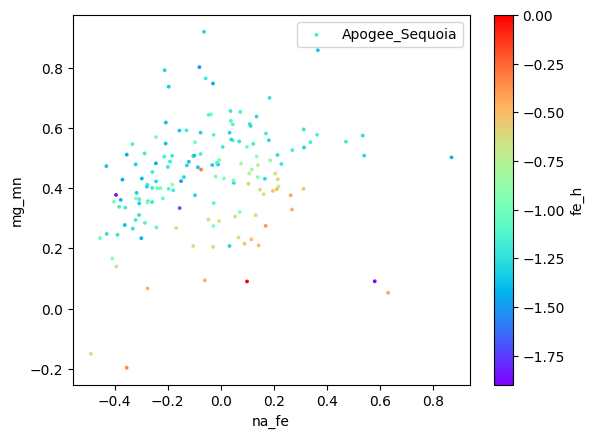

In [23]:
# plt.scatter( Apogee_GSE_new_ratios['al_fe'], Apogee_GSE_new_ratios['mg_mn'], s= 1, alpha = 0.7, c = 'k', label = "Apogee_GSE")
plt.scatter( Apogee_Sequoia_new_ratios['al_fe'], Apogee_Sequoia_new_ratios['mg_mn'], c = Apogee_Sequoia_new_ratios['fe_h'], cmap = 'rainbow', s= 3, label = "Apogee_Sequoia", vmax  = 0)#vmin = -4000, vmax = 0,
# plt.scatter( Apogee_NGC3201_new_ratios['na_fe'], Apogee_NGC3201_new_ratios['mg_mn'], c = 'k', s= 8, label = "Apogee_NGC3201")#vmin = -4000, vmax = 0,

plt.xlabel('na_fe')
plt.ylabel('mg_mn')
plt.legend()
cbar = plt.colorbar()
cbar.set_label('fe_h')

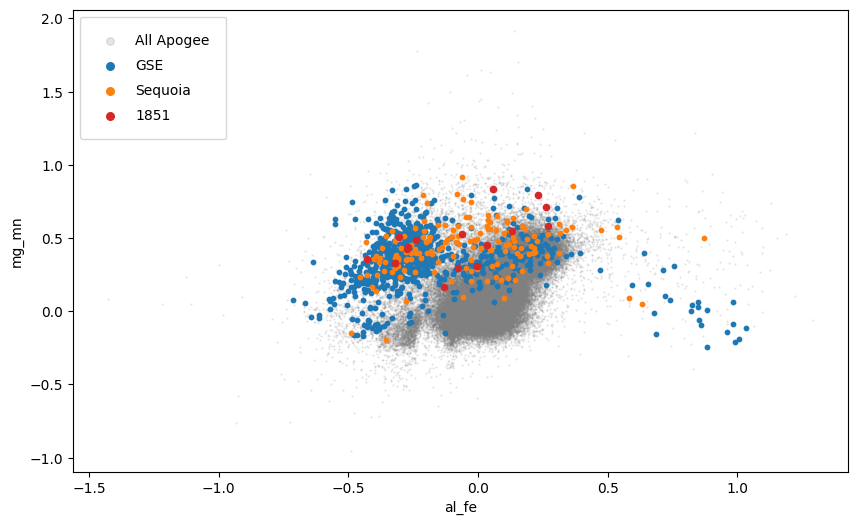

In [24]:
plt.figure(figsize=(10, 6))

elm_ratio1 = 'al_fe'
elm_ratio2 = 'mg_mn'

plt.scatter(Apogee_new_ratios[elm_ratio1], Apogee_new_ratios[elm_ratio2], color = 'grey', label = 'All Apogee', s = 0.3, alpha = 0.2)
plt.scatter(Apogee_GSE_new_ratios[elm_ratio1], Apogee_GSE_new_ratios[elm_ratio2], color = 'C0', label = 'GSE', s = 10)
plt.scatter(Apogee_Sequoia_new_ratios[elm_ratio1], Apogee_Sequoia_new_ratios[elm_ratio2], color = 'C1', label = 'Sequoia', s = 10)
# plt.scatter(Apogee_NGC3201_new_ratios[elm_ratio1], Apogee_NGC3201_new_ratios[elm_ratio2], color = 'orange', label = '3201', s = 10)
# plt.scatter(Apogee_NGC5139_new_ratios[elm_ratio1], Apogee_NGC5139_new_ratios[elm_ratio2], color = 'purple', label = '5139', s = 10)
plt.scatter(Apogee_NGC1851_new_ratios[elm_ratio1], Apogee_NGC1851_new_ratios[elm_ratio2], color = 'C3', label = '1851', s = 20)


plt.xlabel(F'{elm_ratio1}')
plt.ylabel(F'{elm_ratio2}')
leg = plt.legend(fontsize=10, labelspacing=0.8, borderpad=1.2)
for handle in leg.legend_handles:
    handle.set_sizes([30])

In [25]:
for i in Apogee_DR19['gaia_dr3_source_id']:
    if i == 4819197573791661568:
        print(i)

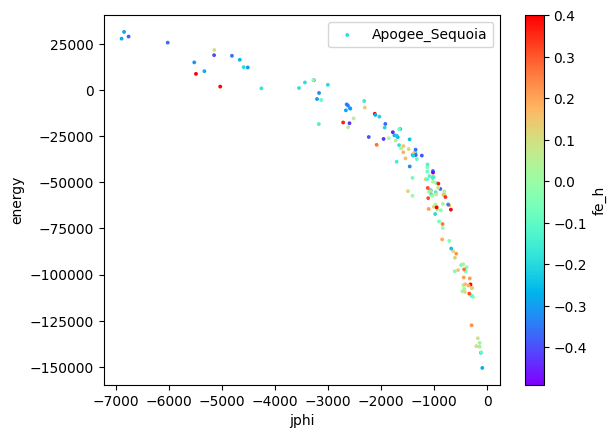

In [26]:
# plt.scatter( Apogee_Sequoia_new_ratios['jphi'], Apogee_Sequoia_new_ratios['energy'], c = Apogee_Sequoia_new_ratios['fe_h'], cmap = 'rainbow', s= 3, label = "Apogee_Sequoia", vmax  = -0.2)#, vmin = -, vmax = 0, )
plt.scatter( Apogee_Sequoia_new_ratios['jphi'], Apogee_Sequoia_new_ratios['energy'], c = Apogee_Sequoia_new_ratios['al_fe'], cmap = 'rainbow', s= 3, label = "Apogee_Sequoia", vmax  = 0.4)#, vmin = -, vmax = 0, )

plt.xlabel('jphi')
plt.ylabel('energy')
plt.legend()
cbar = plt.colorbar()
cbar.set_label('fe_h')

Text(0.5, 1.0, 'no Fe/H or energy cut')

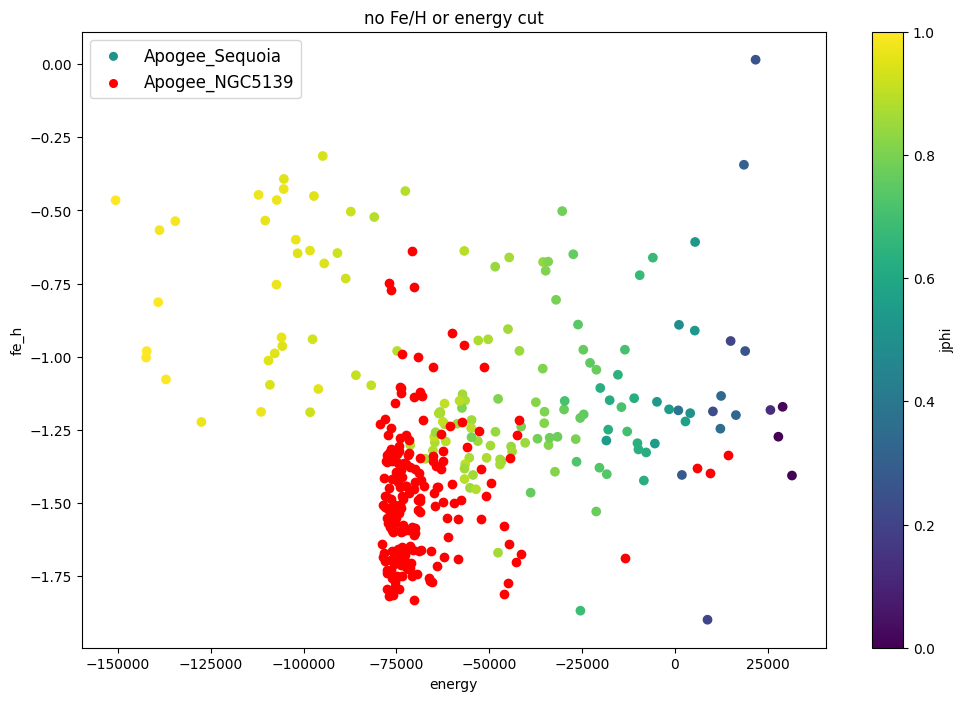

In [27]:
plt.figure(figsize=(12,8))
plt.scatter(Apogee_Sequoia_new_ratios['energy'], Apogee_Sequoia_new_ratios['fe_h'], c = Apogee_Sequoia_new_ratios['jphi'], label = 'Apogee_Sequoia')
plt.scatter(Apogee_NGC5139_new_ratios['energy'], Apogee_NGC5139_new_ratios['fe_h'], label = 'Apogee_NGC5139', c = 'red') #c = Apogee_NGC5139_new_ratios['jphi'])

cbar = plt.colorbar()

leg = plt.legend(fontsize=12)
for handle in leg.legend_handles:
    handle.set_sizes([30])
plt.xlabel('energy')
plt.ylabel('fe_h')
cbar.set_label('jphi')
plt.title('no Fe/H or energy cut')

(-0.4, 1.0)

/home/simon/miniconda3/envs/environment_trial1/lib/python3.14/site-packages/IPython/core/events.py:96: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)



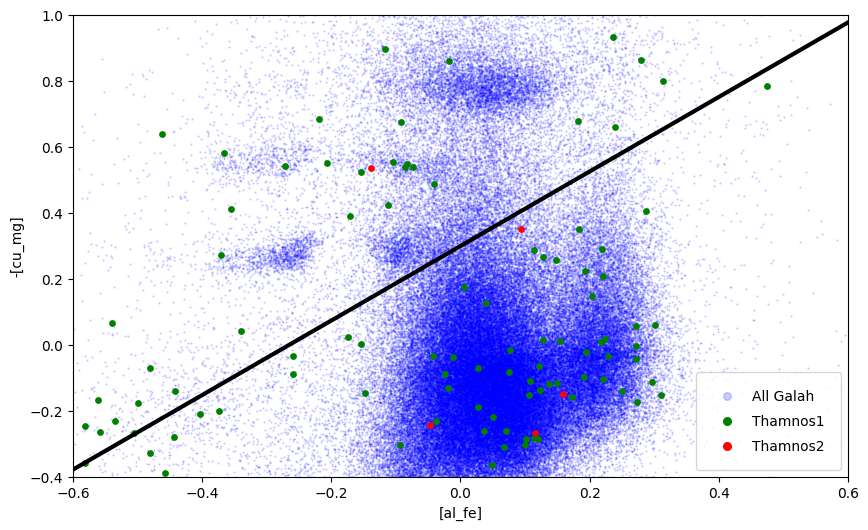

In [28]:
plt.figure(figsize=(10, 6))

elm_ratio1 = 'al_fe'
elm_ratio2 = 'cu_mg'

plt.scatter(Apogee_new_ratios[elm_ratio1], -Apogee_new_ratios[elm_ratio2], color = 'blue', label = 'All Galah', s = 0.3, alpha = 0.2)
# plt.scatter(Apogee_GSE_new_ratios[elm_ratio1], -Apogee_GSE_new_ratios[elm_ratio2], color = 'g', label = 'GSE', s = 10)
# plt.scatter(Apogee_Sequoia_new_ratios[elm_ratio1], -Apogee_Sequoia_new_ratios[elm_ratio2], color = 'r', label = 'Sequoia', s = 10)

plt.scatter(Apogee_Thamnos1_new_ratios[elm_ratio1],- Apogee_Thamnos1_new_ratios[elm_ratio2], color = 'g', label = 'Thamnos1', s = 15)
plt.scatter(Apogee_Thamnos2_new_ratios[elm_ratio1], -Apogee_Thamnos2_new_ratios[elm_ratio2], color = 'r', label = 'Thamnos2', s = 15)

plt.plot([-0.686, 0.685], [-0.476, 1.072], linewidth = 3, c = 'k')

plt.xlabel(F'[{elm_ratio1}]')
plt.ylabel(F'-[{elm_ratio2}]')
leg = plt.legend(fontsize=10, labelspacing=0.8, borderpad=1.2)
for handle in leg.legend_handles:
    handle.set_sizes([30])
plt.xlim(-0.6,0.6)
plt.ylim(-0.4,1)

Text(0.5, 1.0, 'Apogee stream and GC locations')

/home/simon/miniconda3/envs/environment_trial1/lib/python3.14/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)



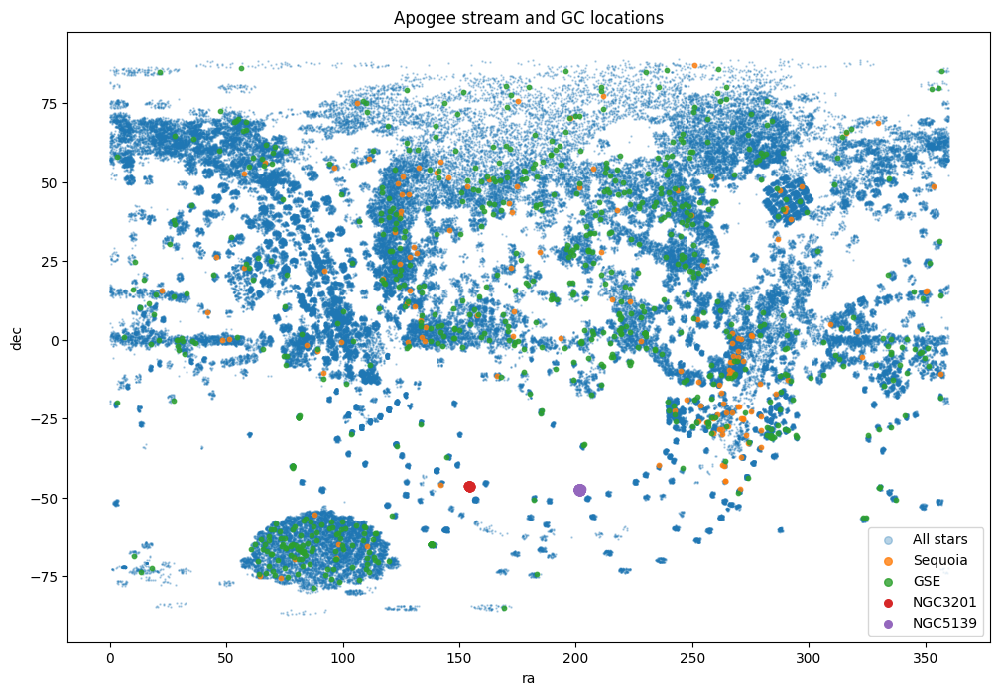

In [29]:
plt.figure(figsize=(12, 8))

# plt.scatter(Apogee_new_ratios['ra'], Apogee_new_ratios['dec'], s = 1, alpha = 0.3, label = 'All stars')
# plt.scatter(Apogee_Sequoia_new_ratios['ra'], Apogee_Sequoia_new_ratios['dec'], s = 2, alpha = 0.5, label = 'Sequoia')
# plt.scatter(Apogee_GSE_new_ratios['ra'], Apogee_GSE_new_ratios['dec'], s = 2, alpha = 0.5, label = 'GSE')
# plt.scatter(Apogee_NGC3201_new_ratios['ra'], Apogee_NGC3201_new_ratios['dec'], label = 'NGC3201')
# plt.scatter(Apogee_NGC5139_new_ratios['ra'], Apogee_NGC5139_new_ratios['dec'], label = 'NGC5139')

plt.scatter(Apogee_new_ratios['ra_gaia'], Apogee_new_ratios['dec_gaia'], s = 0.5, alpha = 0.32, label = 'All stars')
plt.scatter(Apogee_Sequoia_new_ratios['ra_gaia'], Apogee_Sequoia_new_ratios['dec_gaia'], s = 10, alpha = 0.8, label = 'Sequoia')
plt.scatter(Apogee_GSE_new_ratios['ra_gaia'], Apogee_GSE_new_ratios['dec_gaia'], s = 10, alpha = 0.8, label = 'GSE')
plt.scatter(Apogee_NGC3201_new_ratios['ra_gaia'], Apogee_NGC3201_new_ratios['dec_gaia'], label = 'NGC3201')
plt.scatter(Apogee_NGC5139_new_ratios['ra_gaia'], Apogee_NGC5139_new_ratios['dec_gaia'], label = 'NGC5139')


leg = plt.legend()
for handle in leg.legend_handles:
    handle.set_sizes([30])
plt.xlabel('ra')
plt.ylabel('dec')
plt.title('Apogee stream and GC locations')

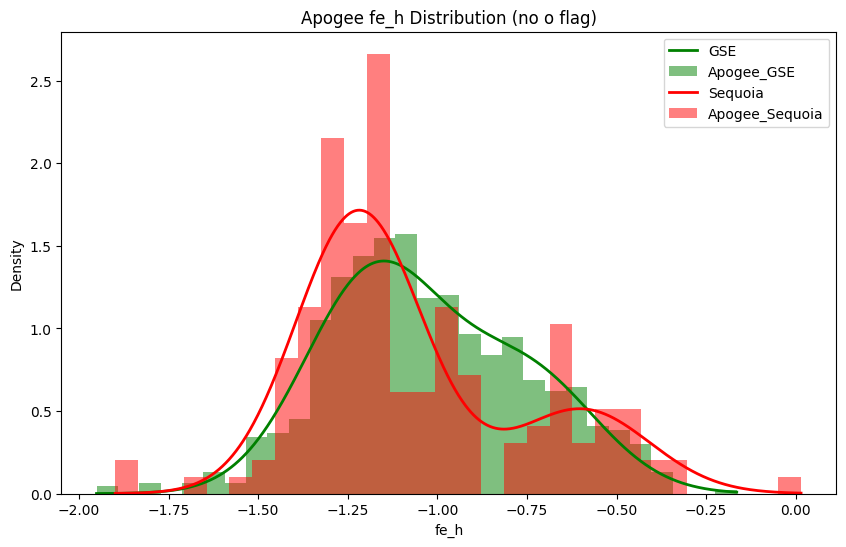

In [30]:
plt.figure(figsize=(10, 6))
elm_ratio = 'fe_h'
# GSE
plot_gmm(Apogee_GSE_new_ratios[elm_ratio], 'GSE', 'g', 2)
plot_hist(Apogee_GSE_new_ratios[elm_ratio], 'Apogee_GSE', 'g', 0.5)

# Sequoia
plot_gmm(Apogee_Sequoia_new_ratios[elm_ratio], 'Sequoia', 'r', 2)
plot_hist(Apogee_Sequoia_new_ratios[elm_ratio], 'Apogee_Sequoia', 'r', 0.5)

# plot_gmm(Apogee_NGC3201_new_ratios[elm_ratio], 'NGC3201', 'b', 2)
# plot_hist(Apogee_NGC3201_new_ratios[elm_ratio], 'NGC3201', 'b', 0.5)

# plot_gmm(Apogee_NGC5139_new_ratios[elm_ratio], 'NGC5139', 'purple', 2)
# plot_hist(Apogee_NGC5139_new_ratios[elm_ratio], 'NGC5139', 'purple', 0.5)

plt.xlabel('fe_h')
plt.ylabel('Density')
plt.title(F'Apogee {elm_ratio} Distribution (no o flag)')
plt.legend()

In [31]:
np.mean(Apogee_Sequoia_new_ratios['fe_h'])

np.float32(-1.0676264)

In [32]:
Apogee_Sequoia_new_ratios

,sdss_id,sdss4_apogee_id,gaia_dr2_source_id,gaia_dr3_source_id,tic_v8_id,healpix,lead,version_id,catalogid,catalogid21,...,cu_ni,e_cu_ni,nd_ni,e_nd_ni,cu_al,e_cu_al,nd_al,e_nd_al,nd_cu,e_nd_cu
405763,54634323,,444168891938300416,444168891938300416,428810620,19467,tic_v8,25,27021597890992246,4331854000,...,-1.379720,0.142263,0.48507,0.054002,-1.332805,0.151340,0.531984,0.074708,1.86479,0.150925
145180,55773982,2M09013802+0359047,578609472902066816,578609472902066816,270469243,91072,gaia_dr3_source,31,63050394817560927,4592571752,...,-1.463620,0.137668,-0.31341,0.052718,-1.476705,0.146097,-0.326496,0.071910,1.15021,0.146401
348008,55810625,,584362190753713024,584362190753713024,444035711,87486,tic_v8,25,27021599488105815,4545469933,...,-0.066599,0.132913,-0.75031,0.050952,-0.059385,0.141271,-0.743096,0.069912,-0.68371,0.141416
140050,55893285,2M08425954+1042241,598414739630537600,598414739630537600,396846918,80314,gaia_dr3_source,31,63050394818210636,4545430219,...,-1.407820,0.135147,-0.15091,0.050739,-1.579145,0.143237,-0.322236,0.069475,1.25691,0.143441
440876,55922846,2M08300180+1134554,602458949557000192,602458949557000192,366527943,78773,gaia_dr3_source,31,63050394818386185,4546518822,...,-1.409020,0.137840,0.28288,0.051383,-1.347806,0.146294,0.344094,0.071009,1.69190,0.146090
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
256684,113199647,2M18371359-3405014,6734772366726781824,6734772366726781824,380065256,153741,gaia_dr3_source,31,63050396520634733,4925285130,...,-1.066579,0.130756,-0.47237,0.048430,-1.236145,0.138610,-0.641936,0.066791,0.59421,0.138659
22966,114888056,2M02481602+0847039,20713600772147328,20713600772147328,387444543,83260,gaia_dr3_source,31,63050396551623873,4402104435,...,-1.515750,0.140202,0.25117,0.052776,-1.397225,0.148926,0.369695,0.072855,1.76692,0.148711
33942,115031964,2M03501984+2251223,64147196289902848,64147196289902848,440696519,59730,gaia_dr3_source,31,63050396552991184,4493769315,...,-1.462220,0.130560,-0.41021,0.048183,-1.327505,0.138378,-0.275496,0.066516,1.05201,0.138403
24993,115251898,2M03015745+2614208,115107670449806336,115107670449806336,34688328,54593,gaia_dr3_source,31,63050396554488701,4505765644,...,-0.868519,0.132759,-0.12131,0.049848,-0.752705,0.140919,-0.005496,0.068688,0.74721,0.140939


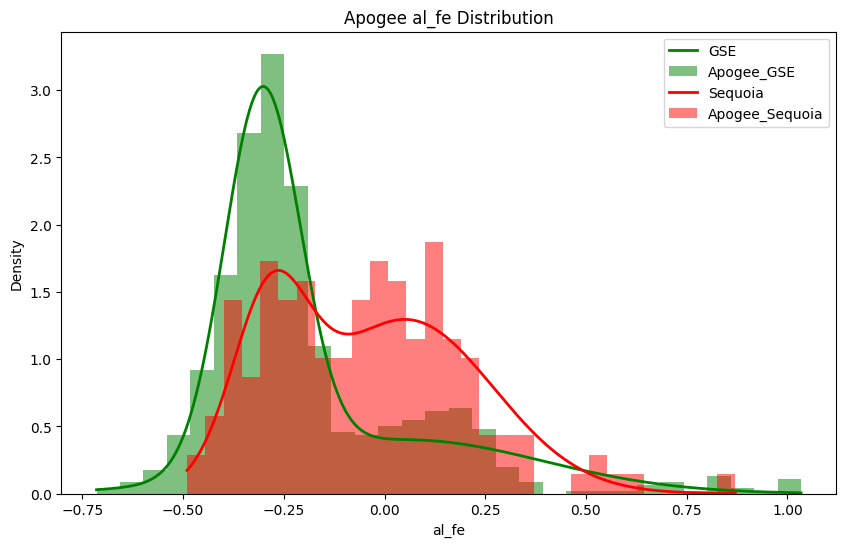

In [33]:
plt.figure(figsize=(10, 6))

elm_ratio = 'al_fe'

# GSE
plot_gmm(Apogee_GSE_new_ratios[elm_ratio], 'GSE', 'g', 2)
plot_hist(Apogee_GSE_new_ratios[elm_ratio], 'Apogee_GSE', 'g', 0.5)

# Sequoia
plot_gmm(Apogee_Sequoia_new_ratios[elm_ratio], 'Sequoia', 'r', 2)
plot_hist(Apogee_Sequoia_new_ratios[elm_ratio], 'Apogee_Sequoia', 'r', 0.5)

# plot_gmm(Apogee_NGC3201_new_ratios[elm_ratio], 'NGC3201', 'b', 2)
# plot_hist(Apogee_NGC3201_new_ratios[elm_ratio], 'NGC3201', 'b',)

# plot_gmm(Apogee_NGC5139_new_ratios[elm_ratio], 'NGC5139', 'purple', 2)
# plot_hist(Apogee_NGC5139_new_ratios[elm_ratio], 'NGC5139', 'purple',)

plt.xlabel(elm_ratio)
plt.ylabel('Density')
plt.title(F'Apogee {elm_ratio} Distribution')
plt.legend()

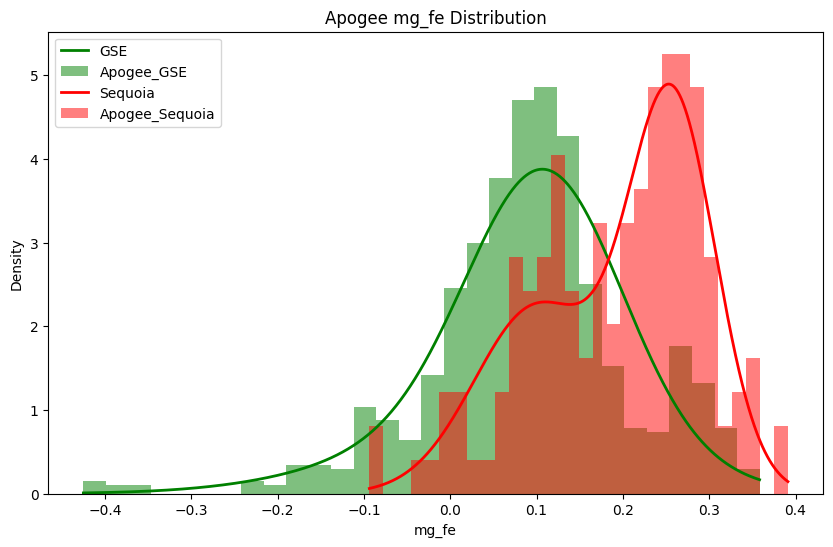

In [34]:
plt.figure(figsize=(10, 6))

elm_ratio = 'mn_al'
elm_ratio = 'nd_ce'
# elm_ratio = 'ce_mg'
# elm_ratio = 'mg_fe'
# elm_ratio = 'fe_h'
elm_ratio = 'mg_fe'

plot_gmm(Apogee_GSE_new_ratios[elm_ratio] , 'GSE', 'g', 2)
plot_hist(Apogee_GSE_new_ratios[elm_ratio], 'Apogee_GSE', 'g', 0.5)

plot_gmm(Apogee_Sequoia_new_ratios[elm_ratio], 'Sequoia', 'r', 2)
plot_hist(Apogee_Sequoia_new_ratios[elm_ratio], 'Apogee_Sequoia', 'r', 0.5)

# plot_gmm(Apogee_NGC3201_new_ratios[elm_ratio], 'NGC3201', 'b', 2)
# plot_hist(Apogee_NGC3201_new_ratios[elm_ratio], 'NGC3201', 'b',)

# plot_gmm(Apogee_NGC5139_new_ratios[elm_ratio], 'NGC5139', 'purple', 2)
# plot_hist(Apogee_NGC5139_new_ratios[elm_ratio], 'NGC5139', 'purple',)

plt.xlabel(elm_ratio)
plt.ylabel('Density')
plt.title(F'Apogee {elm_ratio} Distribution')
plt.legend()

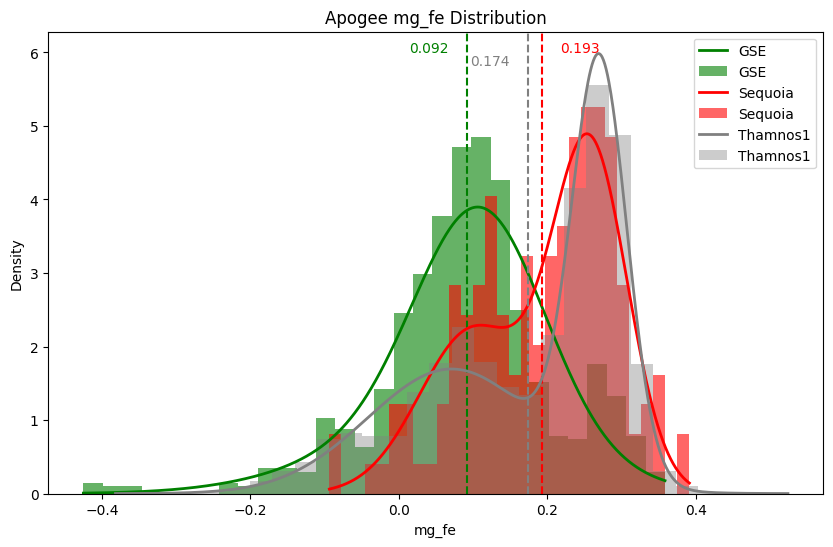

In [35]:
plt.figure(figsize=(10, 6))

elm_ratio = 'mn_al'
elm_ratio = 'nd_ce'
# elm_ratio = 'ce_mg'
# elm_ratio = 'mg_fe'
# elm_ratio = 'fe_h'
elm_ratio = 'mg_fe'
# elm_ratio = 'fe_h'
# elm_ratio = 'mg_mn'

plot_gmm(Apogee_GSE_new_ratios[elm_ratio] , 'GSE', 'g', 2)
plot_hist(Apogee_GSE_new_ratios[elm_ratio], 'GSE', 'g', 0.6)
mean_GSE = np.round(np.mean(Apogee_GSE_new_ratios[elm_ratio]), 3)
plt.axvline(x=mean_GSE, color='g', linestyle='--')
plt.text(mean_GSE - 0.0511, 0.98, f'{mean_GSE:.3f}', color='g', transform=plt.gca().get_xaxis_transform(),
         ha='center', va='top')

plot_gmm(Apogee_Sequoia_new_ratios[elm_ratio], 'Sequoia', 'r', 2)
plot_hist(Apogee_Sequoia_new_ratios[elm_ratio], 'Sequoia', 'r', 0.6)
mean_Sequoia = np.round(np.mean(Apogee_Sequoia_new_ratios[elm_ratio]), 3)
plt.axvline(x=mean_Sequoia, color='r', linestyle='--')
plt.text(mean_Sequoia +0.0511, 0.98, f'{mean_Sequoia:.3f}', color='r', transform=plt.gca().get_xaxis_transform(),
         ha='center', va='top')

# plot_gmm(Apogee_Thamnos1_new_ratios[elm_ratio] , 'Thamnos1', 'b', 2)
# plot_hist(Apogee_Thamnos1_new_ratios[elm_ratio], 'Thamnos1', 'b', 0.4)
# mean_Thamnos1 = np.round(np.mean(Apogee_Thamnos1_new_ratios[elm_ratio]), 3)
# plt.axvline(x=mean_Thamnos1, color='b', linestyle='--')
# plt.text(mean_Thamnos1 -0.0511, 0.95, f'{mean_Thamnos1:.3f}', color='b', transform=plt.gca().get_xaxis_transform(),
#          ha='center', va='top')

# plot_gmm(Apogee_Thamnos2[elm_ratio], 'Thamnos2', 'darkgoldenrod', 2)
# plot_hist(Apogee_Thamnos2[elm_ratio], 'Thamnos2', 'darkgoldenrod')
# mean_Thamnos2 = np.round(np.mean(Apogee_Thamnos2[elm_ratio]), 3)
# plt.axvline(x=mean_Thamnos2, color='darkgoldenrod', linestyle='--')
# plt.text(mean_Thamnos2 -0.11, 0.98, f'{mean_Thamnos2:.3f}', color='darkgoldenrod', transform=plt.gca().get_xaxis_transform(),
#          ha='center', va='top')

# plot_gmm(Apogee_Thamnos2_new_ratios[elm_ratio], 'Thamnos2', 'darkgoldenrod', 2)
# plot_hist(Apogee_Thamnos2_new_ratios[elm_ratio], 'Thamnos2', 'darkgoldenrod')
# mean_Thamnos2 = np.round(np.mean(Apogee_Thamnos2_new_ratios[elm_ratio]), 3)
# plt.axvline(x=mean_Thamnos2, color='darkgoldenrod', linestyle='--')
# plt.text(mean_Thamnos2 -0.11, 0.98, f'{mean_Thamnos2:.3f}', color='darkgoldenrod', transform=plt.gca().get_xaxis_transform(),
#          ha='center', va='top')


# plot_gmm(Apogee_NGC3201_new_ratios[elm_ratio], 'NGC3201', 'b', 2)
# plot_hist(Apogee_NGC3201_new_ratios[elm_ratio], 'NGC3201', 'b',)
# mean = np.round(np.mean(Apogee_NGC3201_new_ratios[elm_ratio]), 3)
# plt.axvline(x=mean, color='b', linestyle='--')
# plt.text(mean + 0.11, 0.98, f'{mean:.3f}', color='b', transform=plt.gca().get_xaxis_transform(),
#          ha='center', va='top')

# plot_gmm(Apogee_NGC5139_new_ratios[elm_ratio], 'NGC5139', 'purple', 2)
# plot_hist(Apogee_NGC5139_new_ratios[elm_ratio], 'NGC5139', 'purple',)
# mean = np.round(np.mean(Apogee_NGC5139_new_ratios[elm_ratio]), 3)
# plt.axvline(x=mean, color='purple', linestyle='--')
# plt.text(mean -0.11, 0.98, f'{mean:.3f}', color='purple', transform=plt.gca().get_xaxis_transform(),
#          ha='center', va='top')

plot_gmm(Apogee_Halo_new_ratios[elm_ratio] , 'Thamnos1', 'grey', 2)
plot_hist(Apogee_Halo_new_ratios[elm_ratio], 'Thamnos1', 'grey', 0.4)
mean = np.round(np.mean(Apogee_Halo_new_ratios[elm_ratio]), 3)
plt.axvline(x=mean, color='grey', linestyle='--')
plt.text(mean -0.0511, 0.95, f'{mean:.3f}', color='grey', transform=plt.gca().get_xaxis_transform(),
         ha='center', va='top')

plt.xlabel(elm_ratio)
plt.ylabel('Density')
plt.title(F'Apogee {elm_ratio} Distribution')
plt.legend()

In [36]:
Apogee_Sequoia_new_ratios_high_mg_fe = Apogee_Sequoia_new_ratios[Apogee_Sequoia_new_ratios['mg_fe'] > 0.18]
print(list(Apogee_Sequoia_new_ratios['gaia_dr3_source_id']))


[444168891938300416, 578609472902066816, 584362190753713024, 598414739630537600, 602458949557000192, 657866776454509312, 671825518949400192, 679208743826634368, 702970152175468416, 703330414032395136, 706033975685640448, 770317266599587456, 772179250887011456, 790417919709230336, 794738107049346304, 822929275947657344, 835958488735510400, 902407680119469056, 908549517712155520, 915427684497953792, 918465257168281472, 930290848322343936, 932038693853508992, 989465121021371136, 996086788063776896, 1018565276797472512, 1022523690456693504, 1024984775436341248, 1028350380528646016, 1030031465088846336, 1079574393884113664, 1115373049376562432, 1181509086101897984, 1226028552429395072, 1331845375392237184, 1387042645812971392, 1415709529585607296, 1452445759257189248, 1491365447224735744, 1552866149087776128, 1561402001451357184, 1686160699636565376, 1714026718034997888, 1727924652385584512, 1747396827219314048, 1943374849204611200, 2042887008075470848, 2051936332370258048, 2086746870501843

In [37]:
print (Apogee_Sequoia_new_ratios_high_mg_fe)

          sdss_id     sdss4_apogee_id   gaia_dr2_source_id  \
348008   55810625                       584362190753713024   
140050   55893285  2M08425954+1042241   598414739630537600   
475476   56948430                       772179250887011456   
132739   57881429  2M08192958+4042263   915427684497953792   
149762   58686106  2M09282687+5624299  1024984775436341248   
...           ...                 ...                  ...   
238854  105434031  2M17343330-3955479  5960909037666331136   
224197  106901338  2M16502509-2555268  6034601438009124736   
207653  109050871  2M16092446-2223479  6242852715560070784   
246314  112715747  2M18013584-4709458  6719473242215556224   
256684  113199647  2M18371359-3405014  6734772366726781824   

         gaia_dr3_source_id  tic_v8_id  healpix             lead  version_id  \
348008   584362190753713024  444035711    87486           tic_v8          25   
140050   598414739630537600  396846918    80314  gaia_dr3_source          31   
475476   772179

In [38]:
for i in (Apogee_Sequoia_new_ratios_high_mg_fe[['gaia_dr3_source_id']]):
    print(i)

gaia_dr3_source_id


In [39]:
Apogee_Sequoia_new_ratios_high_mg_fe

,sdss_id,sdss4_apogee_id,gaia_dr2_source_id,gaia_dr3_source_id,tic_v8_id,healpix,lead,version_id,catalogid,catalogid21,...,cu_ni,e_cu_ni,nd_ni,e_nd_ni,cu_al,e_cu_al,nd_al,e_nd_al,nd_cu,e_nd_cu
348008,55810625,,584362190753713024,584362190753713024,444035711,87486,tic_v8,25,27021599488105815,4545469933,...,-0.066599,0.132913,-0.75031,0.050952,-0.059385,0.141271,-0.743096,0.069912,-0.68371,0.141416
140050,55893285,2M08425954+1042241,598414739630537600,598414739630537600,396846918,80314,gaia_dr3_source,31,63050394818210636,4545430219,...,-1.407820,0.135147,-0.15091,0.050739,-1.579145,0.143237,-0.322236,0.069475,1.25691,0.143441
475476,56948430,,772179250887011456,772179250887011456,148675785,30740,tic_v8,25,27021599488783065,4597892640,...,-1.000620,0.130493,-0.75591,0.048289,-1.066705,0.138298,-0.821996,0.066556,0.24471,0.138375
132739,57881429,2M08192958+4042263,915427684497953792,915427684497953792,18781104,33713,gaia_dr3_source,31,63050394827474858,4361389379,...,-1.403319,0.139725,0.43292,0.052016,-1.772105,0.148016,0.064134,0.071353,1.83624,0.148011
149762,58686106,2M09282687+5624299,1024984775436341248,1024984775436341248,316279544,16523,gaia_dr3_source,31,63050394834428990,4360059362,...,-1.332519,0.138241,-0.36571,0.053326,-1.524645,0.146564,-0.557836,0.072208,0.96681,0.147127
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
238854,105434031,2M17343330-3955479,5960909037666331136,5960909037666331136,465288995,161399,gaia_dr3_source,31,63050396274876718,4661240273,...,0.212611,0.132080,-0.34015,0.049623,0.161055,0.140214,-0.391706,0.068392,-0.55276,0.140238
224197,106901338,2M16502509-2555268,6034601438009124736,6034601438009124736,14885097,141415,gaia_dr3_source,31,63050396387747737,4699633293,...,0.331601,0.131346,-0.37293,0.048982,0.212528,0.139347,-0.492003,0.067566,-0.70453,0.139366
207653,109050871,2M16092446-2223479,6242852715560070784,6242852715560070784,48965750,135769,gaia_dr3_source,31,63050396457919063,4774400471,...,-0.571169,0.133264,-0.38591,0.051114,-0.852495,0.141426,-0.667236,0.069676,0.18526,0.141806
246314,112715747,2M18013584-4709458,6719473242215556224,6719473242215556224,62811464,170730,gaia_dr3_source,31,63050396501913004,5868662451,...,0.432351,0.130712,-0.34987,0.048483,0.220173,0.138610,-0.562047,0.066915,-0.78222,0.138628


In [40]:
Apogee_Thamnos2_new_ratios

,sdss_id,sdss4_apogee_id,gaia_dr2_source_id,gaia_dr3_source_id,tic_v8_id,healpix,lead,version_id,catalogid,catalogid21,...,cu_ni,e_cu_ni,nd_ni,e_nd_ni,cu_al,e_cu_al,nd_al,e_nd_al,nd_cu,e_nd_cu
365461,59437924,,1155811609576176640,1155811609576176640,461263871,91205,tic_v8,25,27021599488123992,5170083951,...,0.005250,0.133727,-0.35521,0.052652,-0.146235,0.142275,-0.506696,0.071634,-0.36046,0.142675
377731,60229396,,1284574179354821760,1284574179354821760,320282472,48182,tic_v8,21,4603757214,4603757214,...,-1.442220,0.141974,-0.86351,0.057117,-1.361905,0.150753,-0.783196,0.076370,0.57871,0.151887
185183,61410220,2M13442105+2808345,1454807338437254784,1454807338437254784,199500541,51749,gaia_dr3_source,31,63050394849206204,4602375885,...,0.414701,0.130533,-0.11820,0.048368,0.543785,0.138424,0.010885,0.066796,-0.53290,0.138426
180371,61494727,2M13230915+3157296,1469373943359157376,1469373943359157376,330867254,46109,gaia_dr3_source,31,63050394849486061,4602465771,...,-1.102620,0.131880,-0.29601,0.049151,-0.983205,0.139863,-0.176596,0.067713,0.80661,0.139923
304798,70939579,2M21522027-0759285,2666731385767048064,2666731385767048064,910087,111826,gaia_dr3_source,31,63050395069738542,4368118119,...,-1.468819,0.131521,-0.94721,0.049018,-2.019545,0.139328,-1.497936,0.067211,0.52161,0.139568
252155,81595787,2M18202770-3216466,4045997456425049472,4045997456425049472,64232240,150663,gaia_dr3_source,31,63050395237480129,4920832858,...,0.390731,0.130421,-0.17863,0.048220,0.294755,0.138272,-0.274606,0.066593,-0.56936,0.138279
248449,83109415,2M18072885-2505049,4065690126378409856,4065690126378409856,248464442,140418,gaia_dr3_source,31,63050395325076786,4987817136,...,-0.352789,0.130434,-0.09913,0.048190,-0.168745,0.138283,0.084915,0.066570,0.25366,0.138282
239654,84893615,2M17362621-2051587,4118299524405732736,4118299524405732736,233596893,133239,gaia_dr3_source,31,63050395472888093,4816783127,...,0.515241,0.131835,-0.15545,0.049653,0.440925,0.139984,-0.229765,0.068414,-0.67069,0.140014
264008,86927869,2M18564540-0357560,4255454254077260416,4255454254077260416,57679471,105108,gaia_dr3_source,31,63050395613671352,5143523834,...,-1.464319,0.130619,-0.26761,0.048204,-1.375905,0.138443,-0.179196,0.066550,1.19671,0.138463
213915,107066534,2M16233842-2437312,6049227828853204224,6049227828853204224,392248753,139357,gaia_dr3_source,31,63050396395058158,4691352633,...,-1.245820,0.132243,-0.45261,0.049504,-1.030005,0.140301,-0.236796,0.068167,0.79321,0.140373


In [41]:
np.mean(Apogee_Sequoia_new_ratios[elm_ratio])

np.float32(0.19348091)

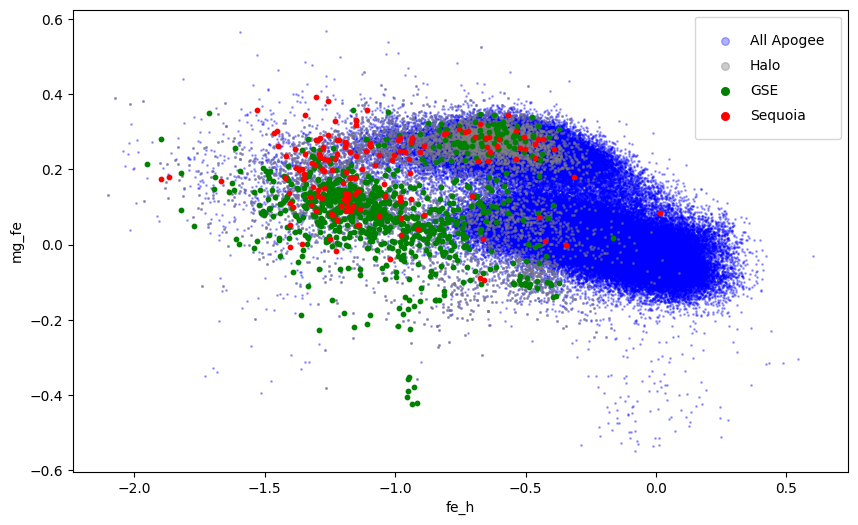

In [42]:
plt.figure(figsize=(10, 6))

elm_ratio1 = 'fe_h'
elm_ratio2 = 'mg_fe'

plt.scatter(Apogee_new_ratios[elm_ratio1], Apogee_new_ratios[elm_ratio2], color = 'blue', label = 'All Apogee', s = 1, alpha = 0.3)
plt.scatter(Apogee_Halo_new_ratios[elm_ratio1], Apogee_Halo_new_ratios[elm_ratio2], color = 'grey', label = 'Halo', s = 1.5, alpha = 0.4)
plt.scatter(Apogee_GSE_new_ratios[elm_ratio1], Apogee_GSE_new_ratios[elm_ratio2], color = 'g', label = 'GSE', s = 10)
plt.scatter(Apogee_Sequoia_new_ratios[elm_ratio1], Apogee_Sequoia_new_ratios[elm_ratio2], color = 'r', label = 'Sequoia', s = 10)
# plt.scatter(Apogee_NGC3201_new_ratios[elm_ratio1], Apogee_NGC3201_new_ratios[elm_ratio2], color = 'orange', label = 'NGC3201', s = 10)
# plt.scatter(Apogee_NGC5139_new_ratios[elm_ratio1], Apogee_NGC5139_new_ratios[elm_ratio2], color = 'purple', label = 'NGC5139', s = 10)


plt.xlabel(F'{elm_ratio1}')
plt.ylabel(F'{elm_ratio2}')
leg = plt.legend(fontsize=10, labelspacing=0.8, borderpad=1.2)
for handle in leg.legend_handles:
    handle.set_sizes([30])

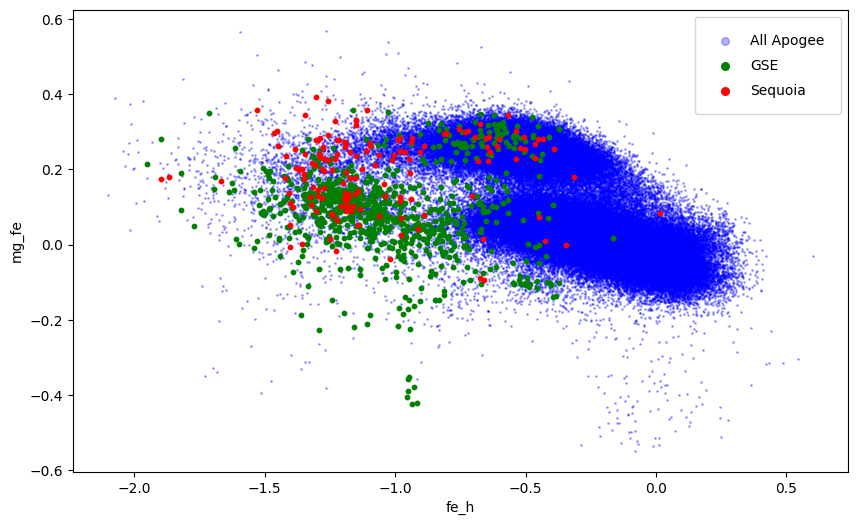

In [43]:
plt.figure(figsize=(10, 6))

elm_ratio1 = 'fe_h'
elm_ratio2 = 'mg_fe'

plt.scatter(Apogee_new_ratios[elm_ratio1], Apogee_new_ratios[elm_ratio2], color = 'blue', label = 'All Apogee', s = 1, alpha = 0.3)
plt.scatter(Apogee_GSE_new_ratios[elm_ratio1], Apogee_GSE_new_ratios[elm_ratio2], color = 'g', label = 'GSE', s = 10)
plt.scatter(Apogee_Sequoia_new_ratios[elm_ratio1], Apogee_Sequoia_new_ratios[elm_ratio2], color = 'r', label = 'Sequoia', s = 10)
# plt.scatter(Apogee_NGC3201_new_ratios[elm_ratio1], Apogee_NGC3201_new_ratios[elm_ratio2], color = 'orange', label = 'NGC3201', s = 10)
# plt.scatter(Apogee_NGC5139_new_ratios[elm_ratio1], Apogee_NGC5139_new_ratios[elm_ratio2], color = 'purple', label = 'NGC5139', s = 10)


plt.xlabel(F'{elm_ratio1}')
plt.ylabel(F'{elm_ratio2}')
leg = plt.legend(fontsize=10, labelspacing=0.8, borderpad=1.2)
for handle in leg.legend_handles:
    handle.set_sizes([30])

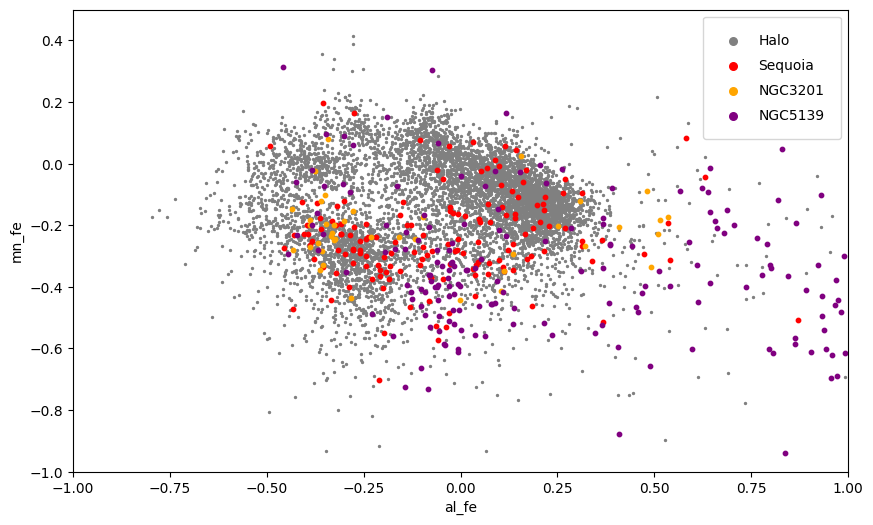

In [44]:
plt.figure(figsize=(10, 6))

# elm_ratio1 = 'fe_h'
# elm_ratio2 = 'al_fe'

elm_ratio1 = 'al_fe'
elm_ratio2 = 'mn_fe'

# plt.scatter(Apogee_new_ratios[elm_ratio1], Apogee_new_ratios[elm_ratio2], color = 'blue', label = 'All Apogee', s = 1, alpha = 0.3)
plt.scatter(Apogee_Halo_new_ratios[elm_ratio1], Apogee_Halo_new_ratios[elm_ratio2], color = 'grey', label = 'Halo', s = 2)
# plt.scatter(Apogee_GSE_new_ratios[elm_ratio1], Apogee_GSE_new_ratios[elm_ratio2], color = 'g', label = 'GSE', s = 10)
plt.scatter(Apogee_Sequoia_new_ratios[elm_ratio1], Apogee_Sequoia_new_ratios[elm_ratio2], color = 'r', label = 'Sequoia', s = 10)
plt.scatter(Apogee_NGC3201_new_ratios[elm_ratio1], Apogee_NGC3201_new_ratios[elm_ratio2], color = 'orange', label = 'NGC3201', s = 10)
plt.scatter(Apogee_NGC5139_new_ratios[elm_ratio1], Apogee_NGC5139_new_ratios[elm_ratio2], color = 'purple', label = 'NGC5139', s = 10)

plt.xlim(-1,1)
plt.ylim(-1, 0.5)
plt.xlabel(F'{elm_ratio1}')
plt.ylabel(F'{elm_ratio2}')
leg = plt.legend(fontsize=10, labelspacing=0.8, borderpad=1.2)
for handle in leg.legend_handles:
    handle.set_sizes([30])

/tmp/ipykernel_34511/3324633800.py:8: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()



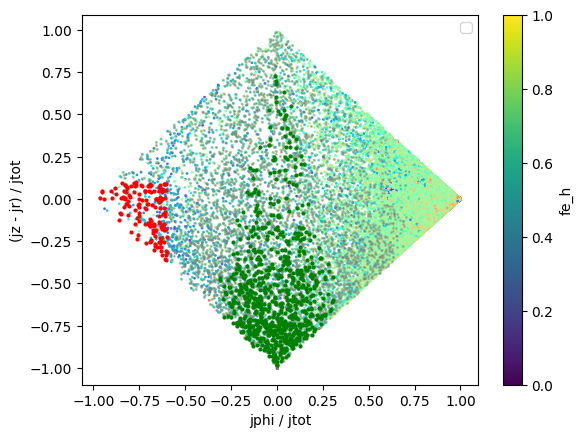

In [45]:
plt.scatter( Apogee_new_ratios['jphi']/ Apogee_new_ratios['jtot'], (Apogee_new_ratios['jz'] - Apogee_new_ratios['jr'])/Apogee_new_ratios['jtot'], s = 0.8, c = Apogee_new_ratios['fe_h'], cmap = 'rainbow' )
plt.scatter( Apogee_Halo_new_ratios['jphi']/ Apogee_Halo_new_ratios['jtot'], (Apogee_Halo_new_ratios['jz'] - Apogee_Halo_new_ratios['jr'])/Apogee_Halo_new_ratios['jtot'], c = 'grey', s = 1, alpha  = 0.4)
plt.scatter( Apogee_GSE_new_ratios['jphi']/ Apogee_GSE_new_ratios['jtot'], (Apogee_GSE_new_ratios['jz'] - Apogee_GSE_new_ratios['jr'])/Apogee_GSE_new_ratios['jtot'], c = 'g', s = 4)
plt.scatter( Apogee_Sequoia_new_ratios['jphi']/ Apogee_Sequoia_new_ratios['jtot'], (Apogee_Sequoia_new_ratios['jz'] - Apogee_Sequoia_new_ratios['jr'])/Apogee_Sequoia_new_ratios['jtot'], c = 'r', s = 4)#c = Apogee_Sequoia_new_ratios['mg_mn'], cmap = 'rainbow', s= 3, label = "Apogee_Sequoia")#, vmax  = 0)

plt.xlabel('jphi / jtot')
plt.ylabel('(jz - jr) / jtot')
plt.legend()
cbar = plt.colorbar()
cbar.set_label('fe_h')

In [46]:
# print(Apogee_NGC3201_new_ratios.iloc[0].T.to_string())
np.std(Apogee_NGC3201_new_ratios['fe_h'])

np.float32(0.06557195)

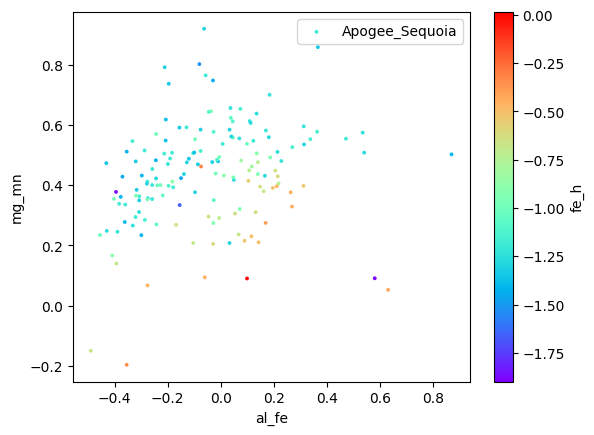

In [47]:
# plt.scatter( Apogee_GSE_new_ratios['al_fe'], Apogee_GSE_new_ratios['mg_mn'], c = Apogee_GSE_new_ratios['fe_h'], cmap = 'rainbow', s= 3, label = "Apogee_GSE")
plt.scatter( Apogee_Sequoia_new_ratios['al_fe'], Apogee_Sequoia_new_ratios['mg_mn'], c = Apogee_Sequoia_new_ratios['fe_h'], cmap = 'rainbow', s= 3, label = "Apogee_Sequoia")

plt.xlabel('al_fe')
plt.ylabel('mg_mn')
plt.legend()
cbar = plt.colorbar()
cbar.set_label('fe_h')

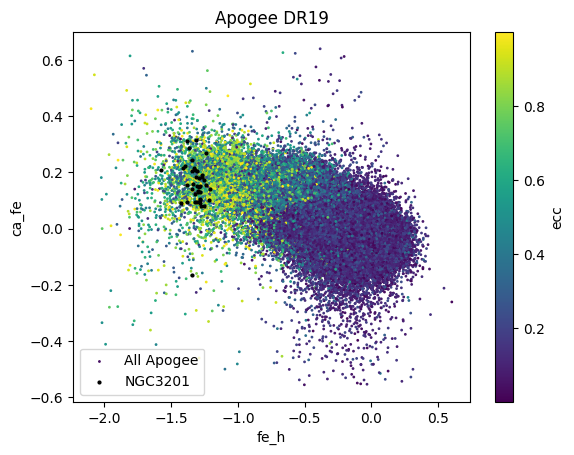

In [48]:
Apogee_new_ratios = Apogee_new_ratios[Apogee_new_ratios['ca_h_flags'] == 0]
Apogee_NGC3201_new_ratios =Apogee_NGC3201_new_ratios[Apogee_NGC3201_new_ratios['ca_h_flags'] == 0]
Apogee_new_ratios = Apogee_new_ratios[Apogee_new_ratios['e_ca_h'] < 0.2]
Apogee_NGC3201_new_ratios =Apogee_NGC3201_new_ratios[Apogee_NGC3201_new_ratios['e_ca_h'] < 0.2]

sc = plt.scatter(Apogee_new_ratios['fe_h'], Apogee_new_ratios['ca_h'] - Apogee_new_ratios['fe_h'], s = 1, c = Apogee_new_ratios['ecc'], label = 'All Apogee')
plt.scatter(Apogee_NGC3201_new_ratios['fe_h'], Apogee_NGC3201_new_ratios['ca_h'] - Apogee_NGC3201_new_ratios['fe_h'], s = 4, c = 'k',label='NGC3201')
cbar = plt.colorbar(sc)
cbar.set_label('ecc')
plt.title("Apogee DR19")
plt.ylabel('ca_fe')
plt.xlabel('fe_h')
plt.legend()

In [49]:
for col in Apogee_DR19.columns:
    print(col)

sdss_id
sdss4_apogee_id
gaia_dr2_source_id
gaia_dr3_source_id
tic_v8_id
healpix
lead
version_id
catalogid
catalogid21
catalogid25
catalogid31
n_associated
n_neighborhood
sdss4_apogee_target1_flags
sdss4_apogee_target2_flags
sdss4_apogee2_target1_flags
sdss4_apogee2_target2_flags
sdss4_apogee2_target3_flags
sdss4_apogee_member_flags
sdss4_apogee_extra_target_flags
ra_Apogee
dec_Apogee
l
b
plx
e_plx
pmra_Apogee
e_pmra
pmde_Apogee
e_pmde
gaia_v_rad
gaia_e_v_rad
g_mag
bp_mag
rp_mag
j_mag
e_j_mag
h_mag
e_h_mag
k_mag
e_k_mag
ph_qual
bl_flg
cc_flg
w1_mag
e_w1_mag
w1_flux
w1_dflux
w1_frac
w2_mag
e_w2_mag
w2_flux
w2_dflux
w2_frac
w1uflags
w2uflags
w1aflags
w2aflags
mag4_5
d4_5m
rms_f4_5
sqf_4_5
mf4_5
csf
zgr_teff
zgr_e_teff
zgr_logg
zgr_e_logg
zgr_fe_h
zgr_e_fe_h
zgr_e
zgr_e_e
zgr_plx
zgr_e_plx
zgr_teff_confidence
zgr_logg_confidence
zgr_fe_h_confidence
zgr_ln_prior
zgr_chi2
zgr_quality_flags
r_med_geo
r_lo_geo
r_hi_geo
r_med_photogeo
r_lo_photogeo
r_hi_photogeo
bailer_jones_flags
ebv
e_ebv
ebv

fe_h_flags
c_h_flags
n_h_flags
o_h_flags
na_h_flags
mg_h_flags
al_h_flags
si_h_flags
p_h_flags
s_h_flags
k_h_flags
ca_h_flags
ti_h_flags
v_h_flags
cr_h_flags
mn_h_flags
co_h_flags
ni_h_flags
cu_h_flags
ce_h_flags
/tmp/ipykernel_34511/2714046248.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10, 6))

nd_h_flags


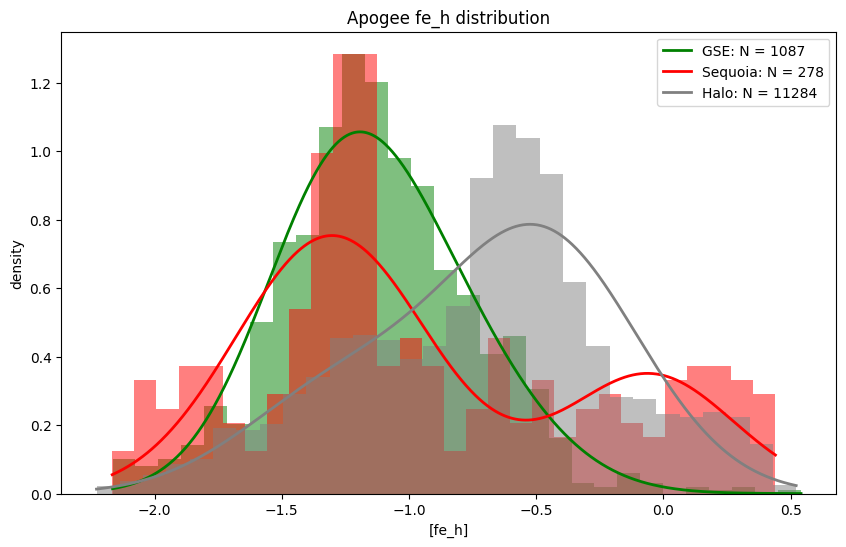

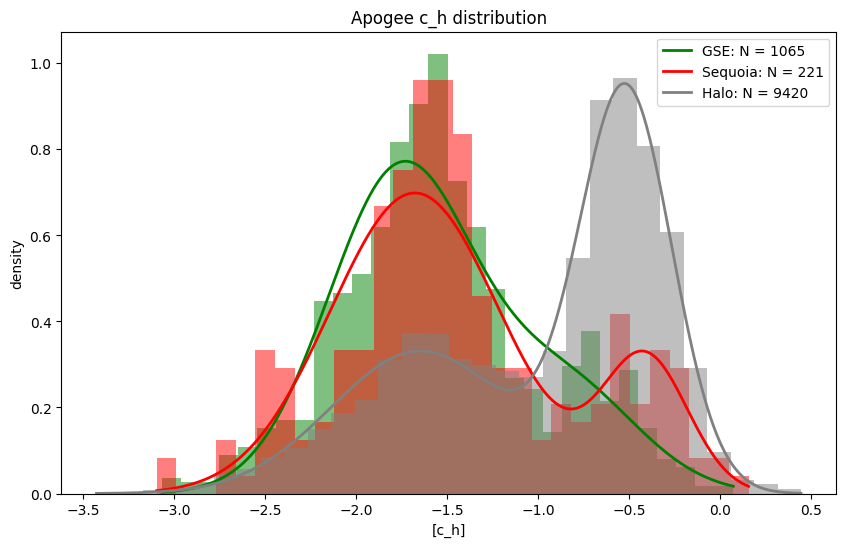

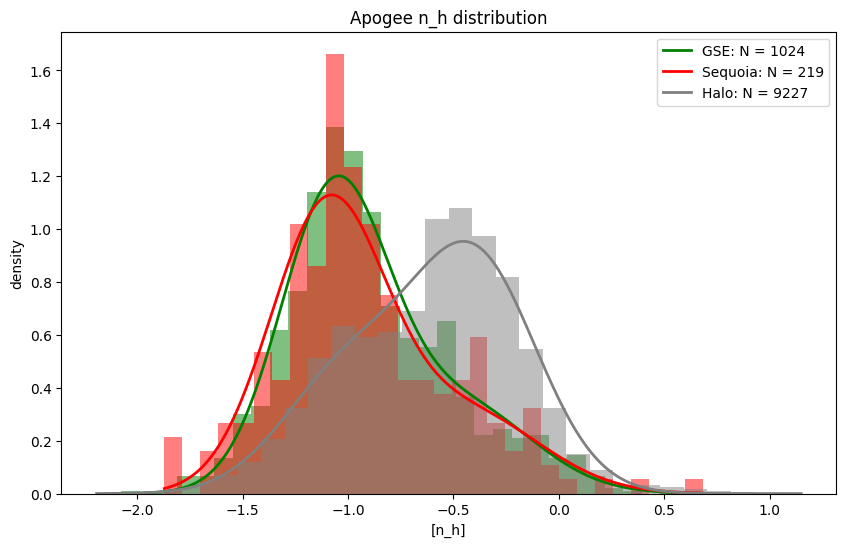

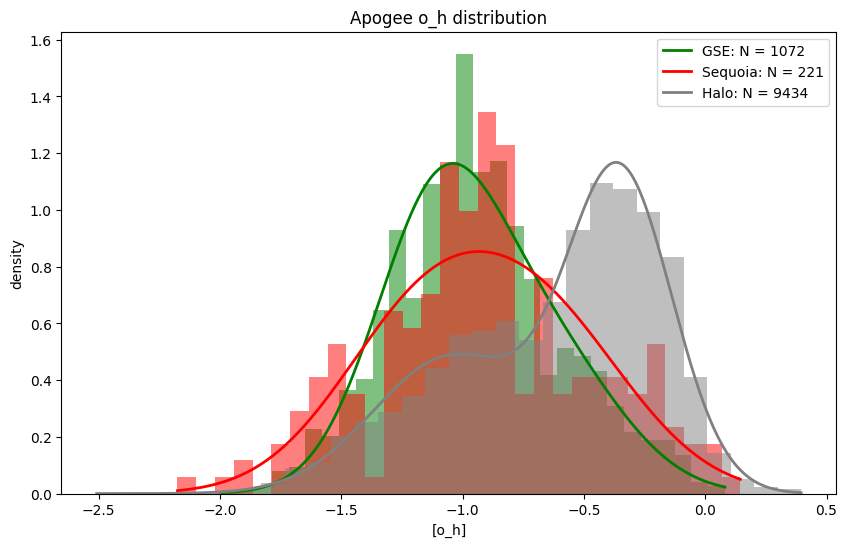

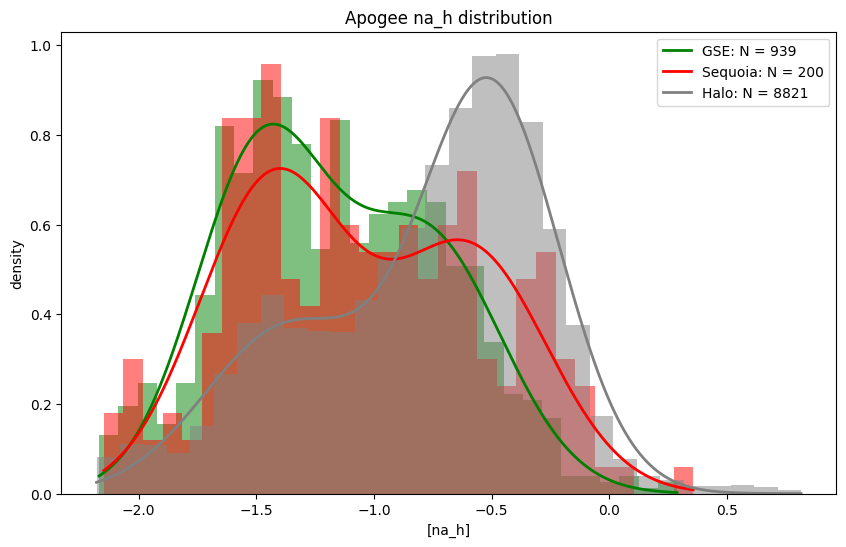

...

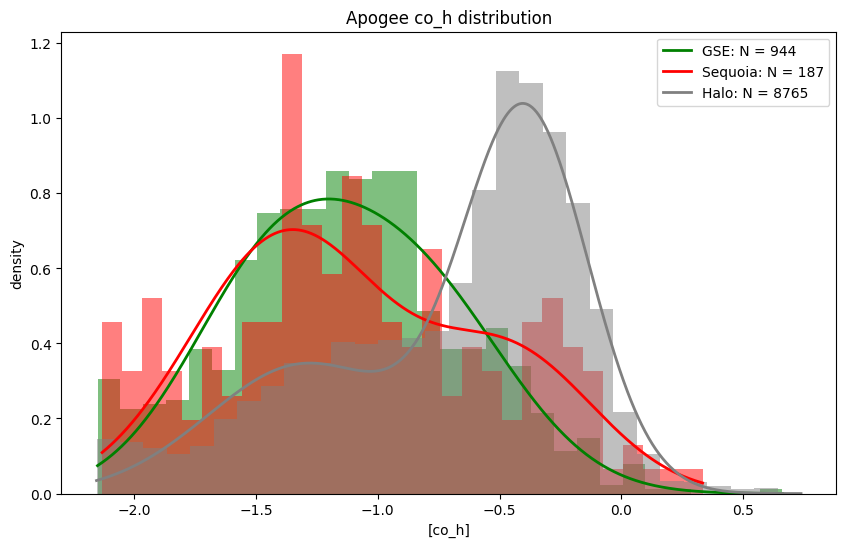

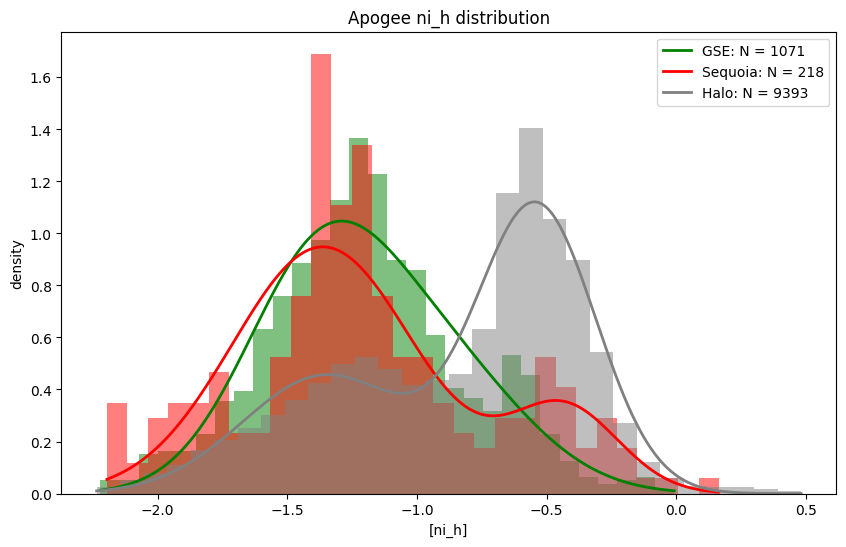

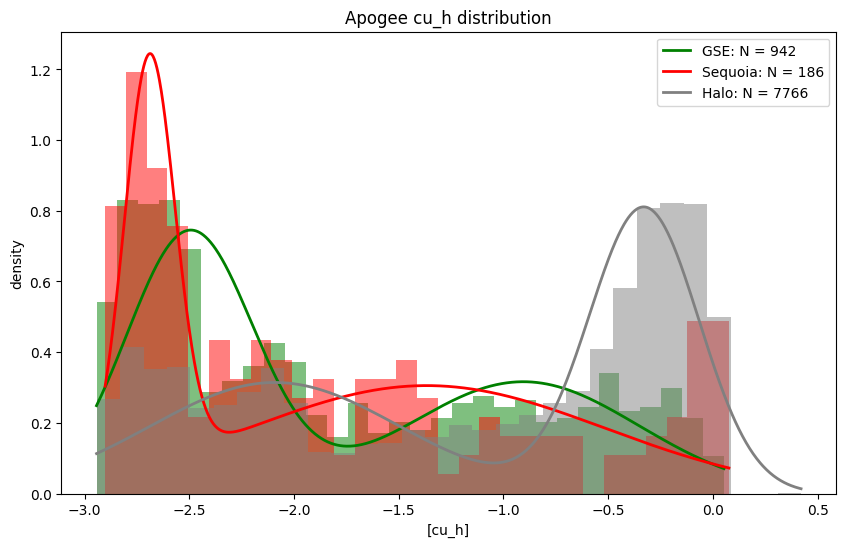

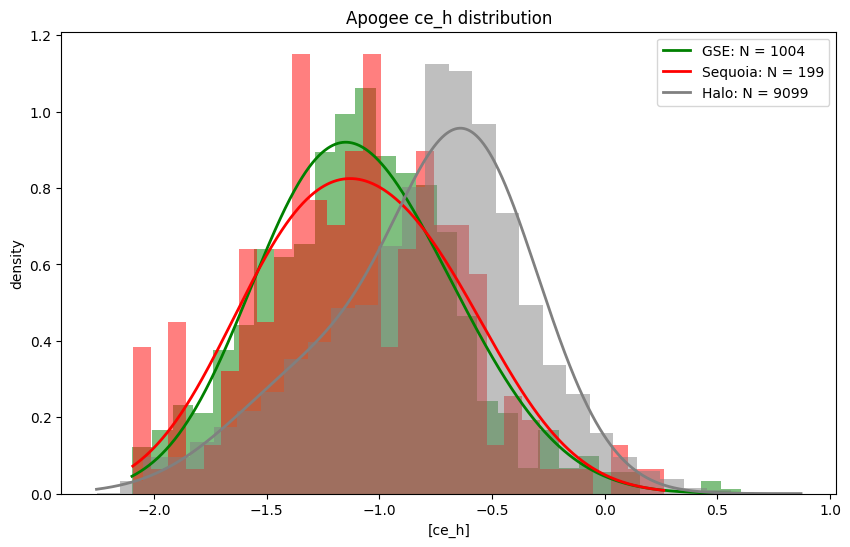

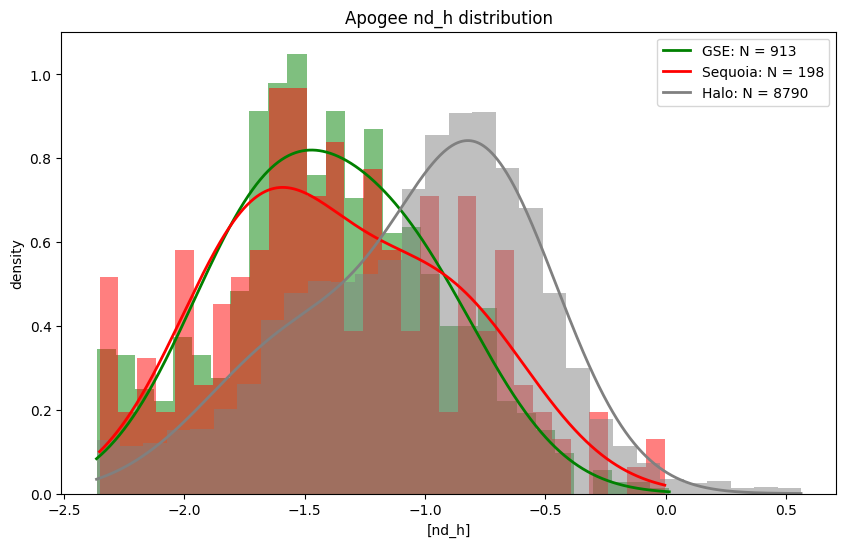

In [50]:
element_list_full_Apogee_minus_h = ["fe", "c", #='c_1',
                                     "n", "o", "na", "mg", "al", "si", "p", "s", "k", "ca" ,"ti", #'ti_2',
                                     "v", "cr" ,"mn", "co", "ni", "cu", "ce", "nd",]# there is nn_li in galah (nural network Li/Fe) but I dont want to include that right now.



for i in element_list_full_Apogee_minus_h:
    plt.figure(figsize=(10, 6))
    x_h = f'{i}' + '_h'
    flag = x_h + '_flags'
    print(flag)
    
    
    Apogee_GSE_copy = Apogee_GSE[(Apogee_GSE[x_h].notna()) & (Apogee_GSE[flag] == 0)]
    num_stars = str(len(Apogee_GSE_copy))
    plot_gmm(Apogee_GSE_copy[x_h] , 'GSE: N = ' + num_stars, 'g', 2)
    plt.hist(Apogee_GSE_copy[x_h], density = 'True', bins  = 30, color = 'g', alpha = 0.5)

    Apogee_Sequoia_copy = Apogee_Sequoia[(Apogee_Sequoia[x_h].notna()) & (Apogee_Sequoia[flag] == 0)]
    num_stars = str(len(Apogee_Sequoia_copy))
    plot_gmm(Apogee_Sequoia_copy[x_h] , 'Sequoia: N = ' + num_stars, 'r', 2)
    plt.hist(Apogee_Sequoia_copy[x_h], density = 'True', bins  = 30, color = 'r', alpha = 0.5)

    # Apogee_Thamnos1_copy = Apogee_Thamnos1[(Apogee_Thamnos1[x_h].notna()) & (Apogee_Thamnos1[flag] == 0)]
    # num_stars = str(len(Apogee_Thamnos1_copy))
    # plot_gmm(Apogee_Thamnos1_copy[x_h] , 'Thamnos1: N = ' + num_stars, 'b', 2)
    # plt.hist(Apogee_Thamnos1_copy[x_h], density = 'True', bins  = 30, color = 'b', alpha = 0.5)

    Apogee_Halo_copy = Apogee_Halo[(Apogee_Halo[x_h].notna()) & (Apogee_Halo[flag] == 0)]
    num_stars = str(len(Apogee_Halo_copy))
    plot_gmm(Apogee_Halo_copy[x_h] , 'Halo: N = ' + num_stars, 'grey', 2)
    plt.hist(Apogee_Halo_copy[x_h], density = 'True', bins  = 30, color = 'grey', alpha = 0.5)

    plt.title(F'Apogee {x_h} distribution')
    plt.xlabel(f'[{x_h}]')
    plt.ylabel('density')
    plt.legend()


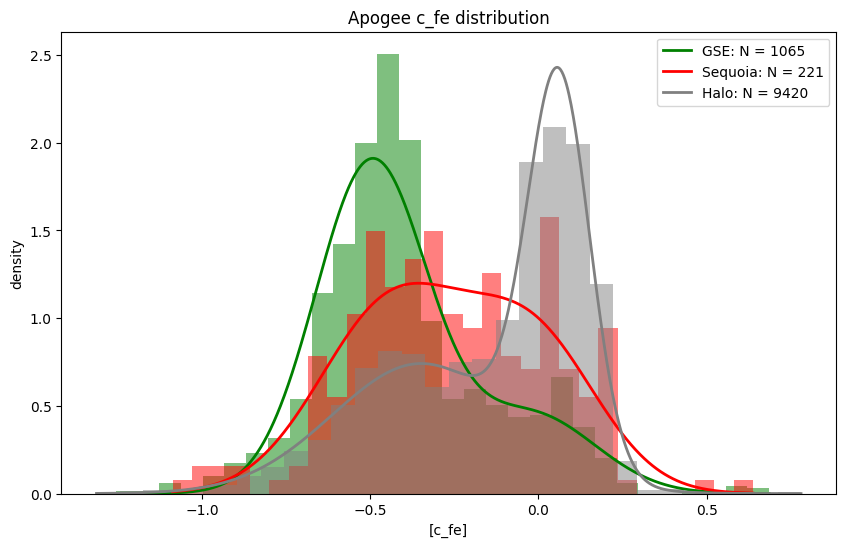

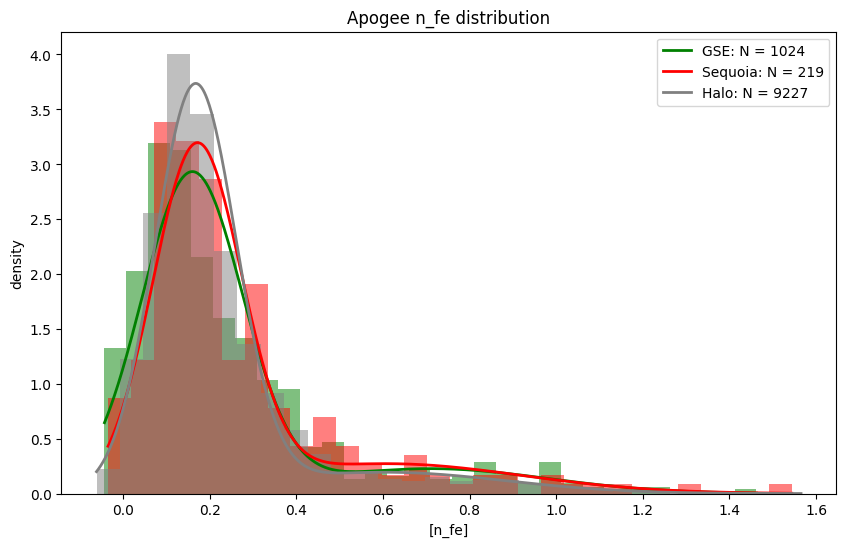

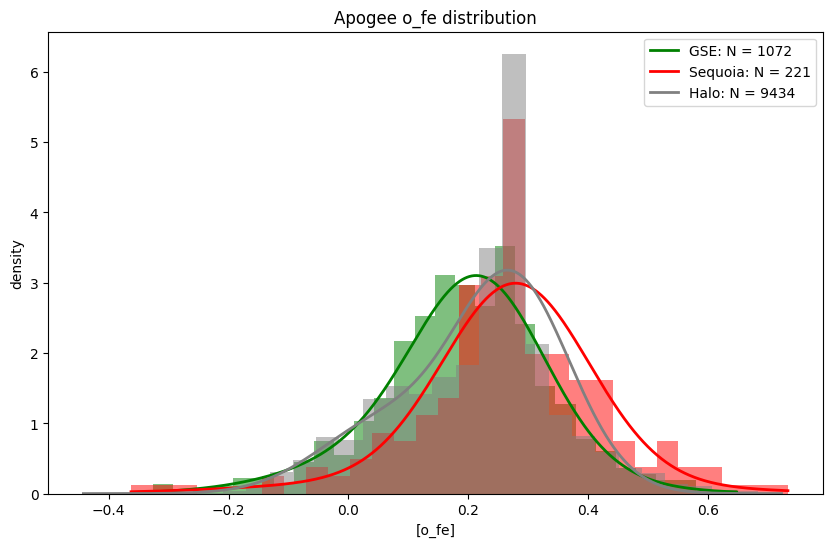

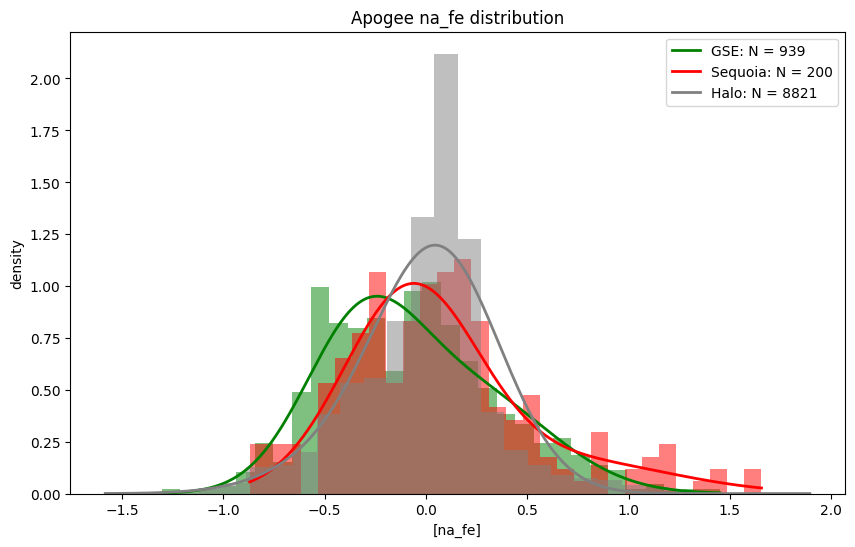

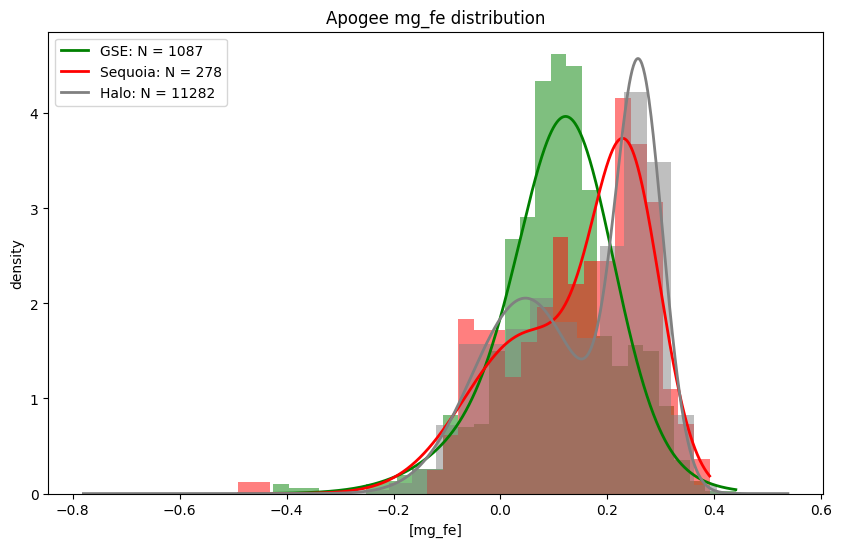

...

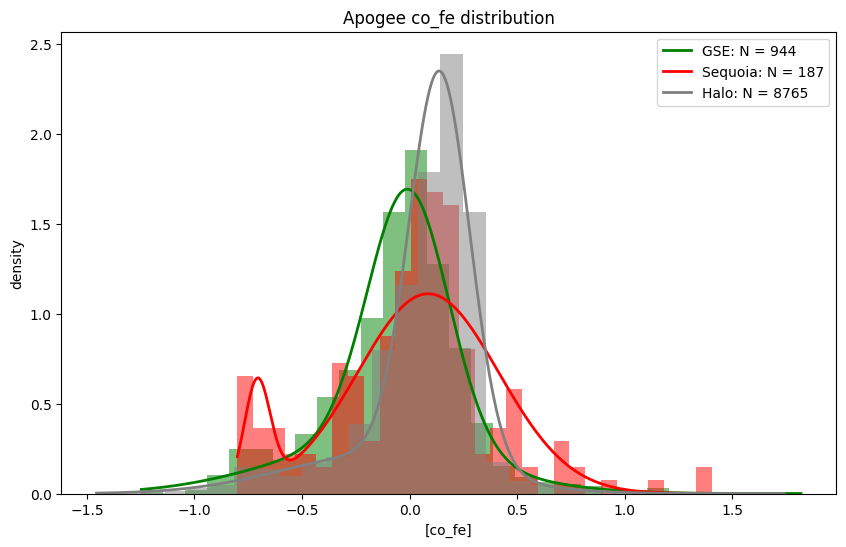

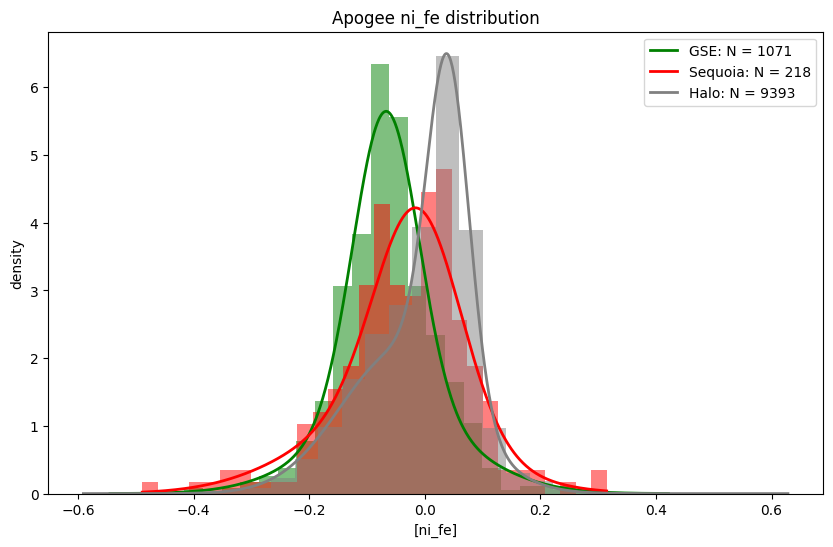

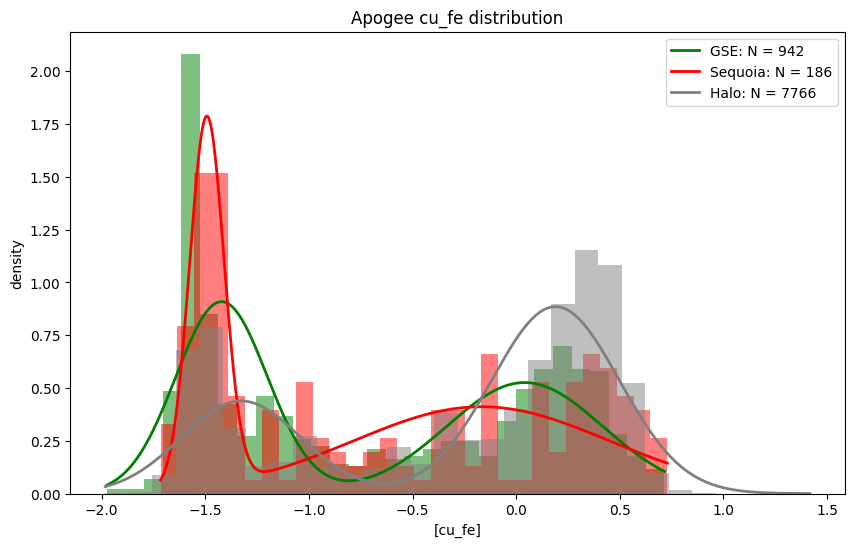

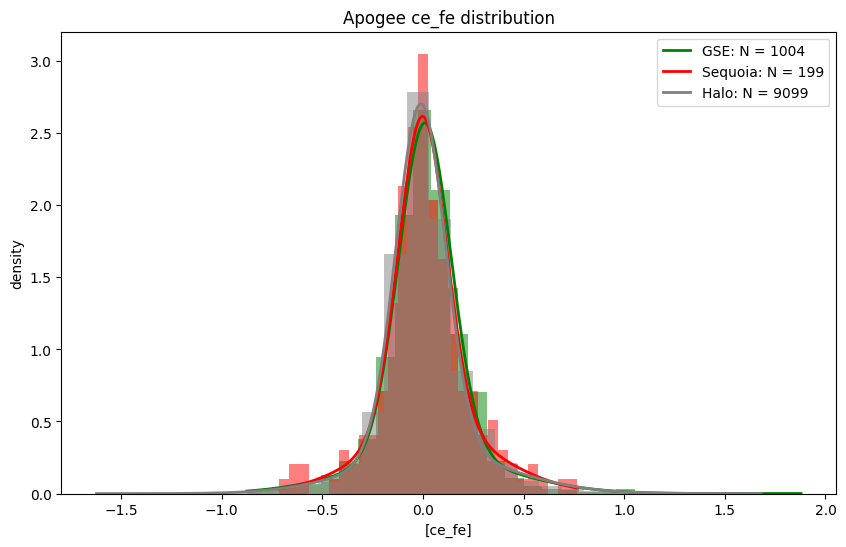

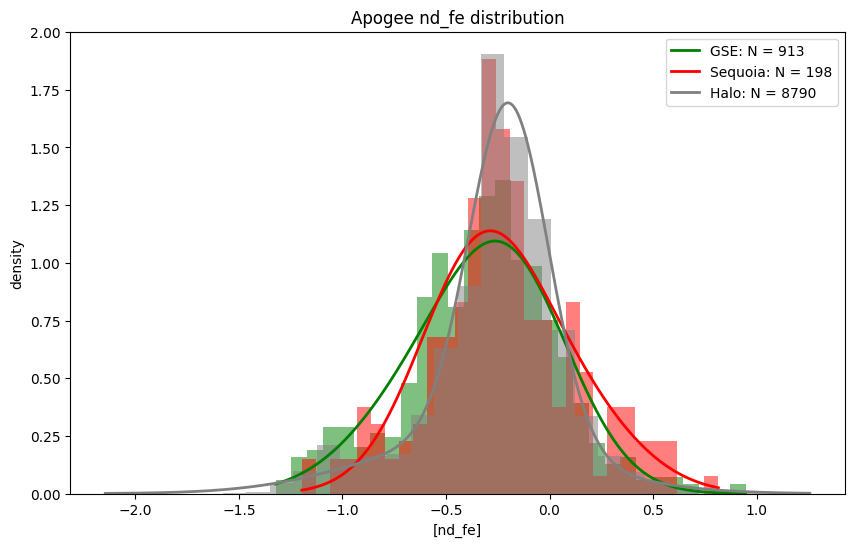

In [51]:
element_list_full_Apogee_minus_fe_and_h = [ "c", #='c_1',
                                     "n", "o", "na", "mg", "al", "si", "p", "s", "k", "ca" ,"ti", #'ti_2',
                                     "v", "cr" ,"mn", "co", "ni", "cu", "ce", "nd",]# there is nn_li in galah (nural network Li/Fe) but I dont want to include that right now.



for i in element_list_full_Apogee_minus_fe_and_h:
    plt.figure(figsize=(10, 6))
    x_h = f'{i}' + '_h'
    x_fe = f'{i}' + '_fe'
    flag = x_h + '_flags'
    
    
    Apogee_GSE_copy = Apogee_GSE[(Apogee_GSE[x_h].notna()) & (Apogee_GSE[flag] == 0)]
    Apogee_GSE_copy[x_fe] = Apogee_GSE_copy[x_h] - Apogee_GSE_copy['fe_h']
    num_stars = str(len(Apogee_GSE_copy))
    plot_gmm(Apogee_GSE_copy[x_fe] , 'GSE: N = ' + num_stars, 'g', 2)
    plt.hist(Apogee_GSE_copy[x_fe], density = 'True', bins  = 30, color = 'g', alpha = 0.5)

    Apogee_Sequoia_copy = Apogee_Sequoia[(Apogee_Sequoia[x_h].notna()) & (Apogee_Sequoia[flag] == 0)]
    Apogee_Sequoia_copy[x_fe] = Apogee_Sequoia_copy[x_h] - Apogee_Sequoia_copy['fe_h']
    num_stars = str(len(Apogee_Sequoia_copy))
    plot_gmm(Apogee_Sequoia_copy[x_fe] , 'Sequoia: N = ' + num_stars, 'r', 2)
    plt.hist(Apogee_Sequoia_copy[x_fe], density = 'True', bins  = 30, color = 'r', alpha = 0.5)

    # Apogee_Thamnos1_copy = Apogee_Thamnos1[(Apogee_Thamnos1[x_h].notna()) & (Apogee_Thamnos1[flag] == 0)]
    # Apogee_Thamnos1_copy[x_fe] = Apogee_Thamnos1_copy[x_h] - Apogee_Thamnos1_copy['fe_h']
    # num_stars = str(len(Apogee_Thamnos1_copy))
    # plot_gmm(Apogee_Thamnos1_copy[x_fe] , 'Thamnos1: N = ' + num_stars, 'b', 2)
    # plt.hist(Apogee_Thamnos1_copy[x_fe], density = 'True', bins  = 30, color = 'b', alpha = 0.5)

    Apogee_Halo_copy = Apogee_Halo[(Apogee_Halo[x_h].notna()) & (Apogee_Halo[flag] == 0)]
    Apogee_Halo_copy[x_fe] = Apogee_Halo_copy[x_h] - Apogee_Halo_copy['fe_h']
    num_stars = str(len(Apogee_Halo_copy))
    plot_gmm(Apogee_Halo_copy[x_fe] , 'Halo: N = ' + num_stars, 'grey', 2)
    plt.hist(Apogee_Halo_copy[x_fe], density = 'True', bins  = 30, color = 'grey', alpha = 0.5)

    plt.title(F'Apogee {x_fe} distribution')
    plt.xlabel(f'[{x_fe}]')
    plt.ylabel('density')
    plt.legend()

In [52]:
''' THIS IS FOR 1D and X/H '''
final_output = []

element_list_full_Apogee_minus_h = ["fe", "c", #='c_1',
                                     "n", "o", "na", "mg", "al", "si", "p", "s", "k", "ca" ,"ti", #'ti_2',
                                     "v", "cr" ,"mn", "co", "ni", "cu", "ce", "nd",]# there is nn_li in galah (nural network Li/Fe) but I dont want to include that right now.

element_list = []
for i in element_list_full_Apogee_minus_h:
    x_h = f'{i}' + '_h'
    element_list.append(x_h)

for i in element_list:
    flag = i + '_flags'

    Apogee_Halo_copy = Apogee_Halo[Apogee_Halo[flag] == 0]
    Apogee_GSE_copy = Apogee_GSE[Apogee_GSE[flag] == 0]
    Apogee_Sequoia_copy = Apogee_Sequoia[Apogee_Sequoia[flag] == 0]

    feature_col = i
    object_to_use = {
        "Halo": Apogee_Halo_copy,
        "GSE": Apogee_GSE_copy,
        # "Sequoia": Apogee_Sequoia_copy,
    }


    # Combine the clusters into a single DataFrame
    df_list = []
    for cluster_name, df in object_to_use.items():
        df_copy = df.copy()
        df_copy["OBJECT_NAME"] = cluster_name  # label column
        df_list.append(df_copy)

    df_all = pd.concat(df_list, ignore_index=True)

    # Classification: one feature at a time
    X = df_all[[i]].copy()
    y = df_all["OBJECT_NAME"].copy()

    # Remove rows where the feature is NaN
    mask = X[i].notna()
    X = X[mask]
    y = y[mask]

    # Skip feature if no data is left
    if X.shape[0] == 0:
        print(f"No data available for feature {i}. Skipping.")
        continue

    # Split into train/test sets
    test_size = 0.2 if X.shape[0] > 10 else 0.1  # adjust test size for very small clusters
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=test_size, random_state=42, stratify=y
    )

    # Train Random Forest classifier
    clf = RandomForestClassifier(n_estimators=100, random_state=42)
    clf.fit(X_train, y_train)

    # Predict and calculate accuracy
    y_pred = clf.predict(X_test)
    acc = accuracy_score(y_test, y_pred)
    final_output.append({
        "ratio1": i,
        "accuracy": acc
        })
    
final_output = pd.DataFrame(final_output)
final_output = final_output.sort_values(
    by="accuracy",
    ascending=False
).reset_index(drop=True)
print(final_output)

   ratio1  accuracy
0    mg_h  0.854891
1    fe_h  0.853737
2    cr_h  0.852402
3    mn_h  0.842345
4     p_h  0.841521
5    si_h  0.841082
6    nd_h  0.840289
7     c_h  0.839771
8    na_h  0.837602
9    al_h  0.837232
10    n_h  0.836177
11   co_h  0.835736
12    s_h  0.833333
13    k_h  0.831156
14    v_h  0.830457
15   ca_h  0.829573
16   ni_h  0.829431
17    o_h  0.827307
18   ce_h  0.825334
19   cu_h  0.821470
20   ti_h  0.819505


In [53]:
''' THIS IS FOR 1D and X/fe '''
final_output = []

element_list_full_Apogee_minus_fe_and_h = [ "c", #='c_1',
                                     "n", "o", "na", "mg", "al", "si", "p", "s", "k", "ca" ,"ti", #'ti_2',
                                     "v", "cr" ,"mn", "co", "ni", "cu", "ce", "nd",]# there is nn_li in galah (nural network Li/Fe) but I dont want to include that right now.

element_list = []
for i in element_list_full_Apogee_minus_fe_and_h:
    x_h = f'{i}' + '_h'
    x_fe = f'{i}' + '_fe'
    flag = x_h + '_flags'
    # element_list.append(x_fe)

# for i in element_list:
#     for j in
#         flag = i + '_flags'

    

    Apogee_Halo_copy = Apogee_Halo[(Apogee_Halo[flag] == 0)]
    Apogee_Halo_copy[x_fe] = Apogee_Halo_copy[x_h] - Apogee_Halo_copy['fe_h']
    Apogee_GSE_copy = Apogee_GSE[Apogee_GSE[flag] == 0]
    Apogee_GSE_copy[x_fe] = Apogee_GSE_copy[x_h] - Apogee_GSE_copy['fe_h']
    Apogee_Sequoia_copy = Apogee_Sequoia[Apogee_Sequoia[flag] == 0]
    Apogee_Sequoia_copy[x_fe] = Apogee_Sequoia_copy[x_h] - Apogee_Sequoia_copy['fe_h']

    feature_col = x_fe
    object_to_use = {
        "Halo": Apogee_Halo_copy,
        "GSE": Apogee_GSE_copy,
        # "Sequoia": Apogee_Sequoia_copy,
    }


    # Combine the clusters into a single DataFrame
    df_list = []
    for cluster_name, df in object_to_use.items():
        df_copy = df.copy()
        df_copy["OBJECT_NAME"] = cluster_name  # label column
        df_list.append(df_copy)

    df_all = pd.concat(df_list, ignore_index=True)

    # Classification: one feature at a time
    X = df_all[[x_fe]].copy()
    y = df_all["OBJECT_NAME"].copy()

    # Remove rows where the feature is NaN
    mask = X[x_fe].notna()
    X = X[mask]
    y = y[mask]

    # Skip feature if no data is left
    if X.shape[0] == 0:
        print(f"No data available for feature {i}. Skipping.")
        continue

    # Split into train/test sets
    test_size = 0.2 if X.shape[0] > 10 else 0.1  # adjust test size for very small clusters
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=test_size, random_state=42, stratify=y
    )

    # Train Random Forest classifier
    clf = RandomForestClassifier(n_estimators=100, random_state=42)
    clf.fit(X_train, y_train)

    # Predict and calculate accuracy
    y_pred = clf.predict(X_test)
    acc = accuracy_score(y_test, y_pred)
    final_output.append({
        "ratio1": x_fe,
        "accuracy": acc
        })
    
final_output = pd.DataFrame(final_output)
final_output = final_output.sort_values(
    by="accuracy",
    ascending=False
).reset_index(drop=True)
print(final_output)

   ratio1  accuracy
0   mg_fe  0.843573
1   mn_fe  0.840323
2    c_fe  0.839294
3   ni_fe  0.838987
4   ti_fe  0.836972
5   al_fe  0.833413
6   co_fe  0.832132
7   na_fe  0.831455
8   nd_fe  0.831015
9    v_fe  0.828934
10   k_fe  0.828737
11  cr_fe  0.828628
12   n_fe  0.826914
13  si_fe  0.826376
14  ce_fe  0.825334
15  ca_fe  0.822372
16  cu_fe  0.815155
17   o_fe  0.805899
18   s_fe  0.804326
19   p_fe  0.801902
